# AnomaData (Automated Anomaly Detection for Predictive Maintenance)

Many different industries need predictive maintenance solutions to reduce risks and gain actionable insights through processing data from their equipment. Although system failure is a very general issue that can occur in any machine, predicting the failure and taking steps to prevent such failure is most important for any machine or software application.

Predictive maintenance evaluates the condition of equipment by performing online monitoring. The goal is to perform maintenance before the equipment degrades or breaks down. This Capstone project is aimed at predicting the machine breakdown by identifying the anomalies in the data. The data we have contains about 18000+ rows collected over few days. The column ‘y’ contains the binary labels, with 1 denoting there is an anomaly. The rest of the columns are predictors.

## Table of Content

1. **[Import Libraries](#lib)**
2. **[Data Preparation](#prep)**
    - 2.1 - **[Understand the Data](#read)**
    - 2.2 - **[Missing Value Treatment](#eda)**
    - 2.3 - **[Check Duplicate Rows](#outlier)**
    - 2.4 - **[Exploratory Data Analysis](#null)**
    - 2.5 - **[Data Cleaning and Feature engineering](#enc)**
    - 2.6 - **[Outlier Detection](#spl)**
    - 2.7 - **[Outlier Treatment](#abc)**
    - 2.8 - **[Balancing Dataset](#aab)**
    - 2.9 - **[Scaling](#aba)**
3. **[Splitting Data into Train and Test](#wlr)**
4. **[Random Forest Classifier Model](#rf)**
     - 4.1 - **[Evaluate the model using the performance metrics](#rf1)**
     - 4.2 - **[Hyperparameter Tuning](#rf2)**
     - 4.3 - **[Model Performance after Hyperparameter Tuning](#rf3)**
     - 4.4 - **[Visualize the feature importances](#rf4)**
5. **[K Nearest Neighbors Model](#knn1)**
     - 5.1 - **[Evaluate the model using the performance metrics](#knn2)**
     - 5.2 - **[Hyperparameter Tuning](#knn3)**
     - 5.3 - **[Model Performance after Hyperparameter Tuning](#knn4)**
     - 5.4 - **[Feature Importance for KNN model](#knn5)**
6. **[Naive Bayes Model](#nbm1)**
     - 6.1 - **[Evaluate the model using the performance metrics](#nbm2)**
     - 6.2 - **[Hyperparameter Tuning](#nbm3)**
     - 6.3 - **[Model Performance after Hyperparameter Tuning](#nbm4)**
7. **[Logistic Regression Model](#lr1)**
     - 7.1 - **[Evaluate the model using the performance metrics](#lr2)**
     - 7.2 - **[Hyperparameter Tuning](#lr3)**
     - 7.3 - **[Model Performance after Hyperparameter Tuning](#lr4)**
     - 7.4 - **[Feature Importance for LR model](#lr5)**
8. **[Conclusion](#cl1)**

<a id="lib"></a>
# 1. Import Libraries

In [1]:
# Import all necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, classification_report, plot_confusion_matrix, plot_roc_curve, log_loss
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')
np.random.seed(42)

<a id="prep"></a>
# 2. Data Preperation

In [2]:
# Display all columns of the dataset
pd.set_option('display.max_columns', None)

In [3]:
# Load the dataset
df = pd.read_excel('AnomaData.xlsx')
df.head()

,time,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x54,x55,x56,x57,x58,x59,x60,y.1
0,1999-05-01 00:00:00,0,0.376665,-4.596435,-4.095756,13.497687,-0.118830,-20.669883,0.000732,-0.061114,-0.059966,-0.038189,0.877951,-0.052959,-13.306135,0.101068,0.041800,0.199901,-2.327329,-0.944167,3.075199,0.123154,-0.104334,-0.570710,-9.784456,0.355960,15.842819,-0.451973,-0.105282,96,-134.27786,0.058726,-0.021645,9.366755,0.002151,-69.187583,4.232571,-0.225267,-0.196872,-0.072449,-0.103732,-0.720746,-5.412436,76.679042,-0.632727,1351.63286,-0.657096,-0.434947,-108.77597,0.084856,10.210182,11.295155,29.984624,10.091721,-4.936434,-24.590146,18.515436,3.473400,0.033444,0.953219,0.006076,0
1,1999-05-01 00:02:00,0,0.475720,-4.542502,-4.018359,16.230659,-0.128733,-18.758079,0.000732,-0.061114,-0.059966,-0.038189,0.873273,-0.014244,-13.306135,0.101108,0.041447,0.304313,-2.340627,-0.939994,3.075199,0.123154,-0.104334,-0.574861,-9.784456,0.360160,16.491684,-0.450450,-0.092430,96,-134.48019,0.058759,-0.004579,9.350215,0.002149,-68.585197,4.311490,-0.225267,-0.196872,-0.059103,-0.083895,-0.720746,-8.343222,78.181598,-0.632727,1370.37895,-0.875629,-1.125819,-108.84897,0.085146,12.534340,11.290761,29.984624,10.095871,-4.937179,-32.413266,22.760065,2.682933,0.033536,1.090502,0.006083,0
2,1999-05-01 00:04:00,0,0.363848,-4.681394,-4.353147,14.127997,-0.138636,-17.836632,0.010803,-0.061114,-0.030057,-0.018352,1.004910,0.065150,-9.619596,0.101148,0.041095,0.252839,-2.353925,-0.935824,3.075199,0.123154,-0.104334,-0.579013,-9.784456,0.364356,15.972885,-0.448927,-0.097144,96,-133.94659,0.058791,-0.084658,9.037409,0.002148,-67.838187,4.809914,-0.225267,-0.186801,-0.048696,-0.073823,-0.720746,-1.085166,79.684154,-0.632727,1368.12309,-0.037775,-0.519541,-109.08658,0.085436,18.582893,11.286366,29.984624,10.100265,-4.937924,-34.183774,27.004663,3.537487,0.033629,1.840540,0.006090,0
3,1999-05-01 00:06:00,0,0.301590,-4.758934,-4.023612,13.161566,-0.148142,-18.517601,0.002075,-0.061114,-0.019986,-0.008280,0.930037,-0.067199,-15.196531,0.101188,0.040742,0.072873,-2.367223,-0.931651,3.075199,0.123154,-0.104334,-0.583165,-9.784456,0.368556,15.608688,-0.447404,-0.160073,96,-134.00259,0.058824,-0.055118,9.020625,0.002146,-67.091148,5.308343,-0.225267,-0.186801,-0.047017,-0.063752,-0.720746,6.172891,81.186702,-0.632727,1365.69145,-0.987410,0.674524,-109.56277,0.085726,17.719032,11.281972,29.984624,10.104660,-4.938669,-35.954281,21.672449,3.986095,0.033721,2.554880,0.006097,0
4,1999-05-01 00:08:00,0,0.265578,-4.749928,-4.333150,15.267340,-0.155314,-17.505913,0.000732,-0.061114,-0.030057,-0.008280,0.828410,-0.018472,-14.609266,0.101229,0.040390,0.171033,-2.380521,-0.927478,3.075199,0.123154,-0.104334,-0.587316,-9.784456,0.372756,15.606125,-0.445879,-0.131630,96,-133.14571,0.058856,-0.153851,9.344233,0.002145,-65.991813,5.806771,-0.225267,-0.186801,-0.057088,-0.063752,-0.720746,-3.379599,82.689258,-0.632727,1363.25786,-0.238445,-0.063044,-110.03891,0.086016,16.855202,11.277577,29.984624,10.109054,-4.939414,-37.724789,21.907251,3.601573,0.033777,1.410494,0.006105,0


<a id="read"></a>
# 2.1 Understand the Data

In [4]:
# Check number of rows and columns of the dataset
print("Rows and Columns of the dataset are:", df.shape)

Rows and Columns of the dataset are: (18398, 62)


In [5]:
# Check informations of the dataset
print("Information of the dataset: ")
print()
df.info()

Information of the dataset: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18398 entries, 0 to 18397
Data columns (total 62 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   time    18398 non-null  datetime64[ns]
 1   y       18398 non-null  int64         
 2   x1      18398 non-null  float64       
 3   x2      18398 non-null  float64       
 4   x3      18398 non-null  float64       
 5   x4      18398 non-null  float64       
 6   x5      18398 non-null  float64       
 7   x6      18398 non-null  float64       
 8   x7      18398 non-null  float64       
 9   x8      18398 non-null  float64       
 10  x9      18398 non-null  float64       
 11  x10     18398 non-null  float64       
 12  x11     18398 non-null  float64       
 13  x12     18398 non-null  float64       
 14  x13     18398 non-null  float64       
 15  x14     18398 non-null  float64       
 16  x15     18398 non-null  float64       
 17  x16     18398 non-nu

In [6]:
# Check the columns of the dataset
print("The columns of dataset are: ")
df.columns

The columns of dataset are: 


Index(['time', 'y', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9',
       'x10', 'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19',
       'x20', 'x21', 'x22', 'x23', 'x24', 'x25', 'x26', 'x27', 'x28', 'x29',
       'x30', 'x31', 'x32', 'x33', 'x34', 'x35', 'x36', 'x37', 'x38', 'x39',
       'x40', 'x41', 'x42', 'x43', 'x44', 'x45', 'x46', 'x47', 'x48', 'x49',
       'x50', 'x51', 'x52', 'x54', 'x55', 'x56', 'x57', 'x58', 'x59', 'x60',
       'y.1'],
      dtype='object')

In [7]:
# Check the descriptive summary of the dataset
print("Descriptive summary of the dataset: ")
df.describe()

Descriptive summary of the dataset: 


,time,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x54,x55,x56,x57,x58,x59,x60,y.1
count,18398,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000,18398.000000
mean,1999-05-15 01:20:42.728557312,0.006740,0.011824,0.157986,0.569300,-9.958345,0.006518,2.387533,0.001647,-0.004125,-0.003056,-0.002511,-0.011166,0.014964,1.418065,0.003222,0.001107,-0.075376,0.138210,0.105010,0.463652,-0.001578,0.076673,-0.036124,-0.088743,-0.393265,0.635612,0.048185,-0.006214,100.141646,7.054580,0.003785,-0.000296,-0.400527,0.000090,4.525465,0.050165,-0.001182,-0.021693,-0.004367,-0.003903,-0.036444,-0.006410,0.266766,0.070846,403.959326,0.090221,0.032000,-0.983876,0.002474,5.051040,0.602553,-3.357339,0.380519,0.173708,2.379154,9.234953,0.233493,-0.001861,-0.061522,0.001258,0.001033
min,1999-05-01 00:00:00,0.000000,-3.787279,-17.316550,-18.198509,-322.781610,-1.623988,-279.408440,-0.429273,-0.451141,-0.120087,-0.098310,-26.191152,-22.223434,-164.897670,-0.028775,-0.623730,-19.901141,-14.081542,-18.313006,-156.929680,-1.520451,-7.106501,-3.228480,-236.783570,-12.411317,-579.412730,-2.333210,-1.807603,51.000000,-228.302190,-0.262892,-0.539117,-608.372930,-0.001809,-508.638880,-4.764285,-0.945199,-1.706928,-0.147118,-0.163853,-5.700757,-58.183432,-39.592770,-0.632727,-3768.476500,-2.753967,-2.453742,-174.148590,-5.484846,-450.744260,-23.448985,-3652.989000,-187.943440,-8.210370,-230.574030,-269.039500,-12.640370,-0.149790,-100.810500,-0.012229,0.000000
25%,1999-05-08 03:36:30,0.000000,-0.405681,-2.158235,-3.537054,-111.378372,-0.446787,-24.345268,-0.058520,-0.051043,-0.059966,-0.048260,-0.268052,-0.188745,-28.720384,-0.028775,-0.019850,-0.260779,-1.329108,-1.321521,-3.926967,0.123154,-0.408417,-0.604798,-4.784303,-4.291578,4.265595,-0.750072,-0.246588,84.000000,-66.014561,-0.083071,-0.065516,4.077524,-0.000990,-55.730629,-0.760257,-0.165146,-0.186801,-0.086997,-0.103732,-0.230619,-2.987541,-39.051126,-0.632727,-637.123492,-0.778840,-0.434027,-32.335066,-0.011280,-64.577736,-3.883678,29.984624,-3.672684,0.487780,-40.050046,-45.519149,-1.598804,0.000470,0.295023,-0.001805,0.000000
50%,1999-05-14 18:39:00,0.000000,0.128245,-0.075505,-0.190683,-14.881585,-0.120745,10.528435,-0.009338,-0.000993,-0.030057,-0.018352,0.367737,0.511975,0.387522,-0.028775,0.002187,0.201777,-0.527784,-0.627076,3.075199,0.123154,-0.104334,-0.230342,-0.205408,0.220845,7.586258,-0.181393,0.107681,96.000000,27.755752,0.060843,-0.002557,5.846613,0.000311,25.756509,0.037213,-0.005229,-0.047026,-0.054631,-0.053986,0.269274,-0.077903,-36.681261,-0.632727,912.977579,-0.416882,-0.075129,31.360231,0.050032,19.014931,0.065663,29.984624,0.294846,0.702299,17.471317,1.438806,0.085826,0.012888,0.734591,0.000710,0.000000
75%,1999-05-22 06:01:30,0.000000,0.421222,2.319297,3.421223,92.199134,0.325152,32.172974,0.060515,0.038986,0.001990,0.011557,0.820468,0.749715,36.818686,-0.028775,0.020421,0.662305,1.438410,1.454142,3.075199,0.123154,0.901555,0.775548,4.442544,1.873631,10.650238,0.823543,0.373235,112.000000,91.181847,0.069487,0.066371,7.930278,0.000567,62.300928,1.241757,0.124780,0.162941,0.003033,0.014863,0.379140,2.991708,29.10

<a id="eda"></a>
# 2.2 Missing Value Treatment

In [8]:
# Check for null values
print("Percentage count of Null Values: ")
df.isnull().sum()*100/len(df)

Percentage count of Null Values: 


time    0.0
y       0.0
x1      0.0
x2      0.0
x3      0.0
       ... 
x57     0.0
x58     0.0
x59     0.0
x60     0.0
y.1     0.0
Length: 62, dtype: float64

There are no null values in our dataset so we are good to go ahead with our analysis.

<a id="outlier"></a>
# 2.3 Check Duplicate Rows

In [9]:
# Check for duplicates
print("Count of duplicate rows: ")
df.duplicated().sum()

Count of duplicate rows: 


0

There are no duplicate rows in our dataset so we are good to go ahead with our anlysis.

<a id="null"></a>
# 2.4 Exploratory Data Analysis

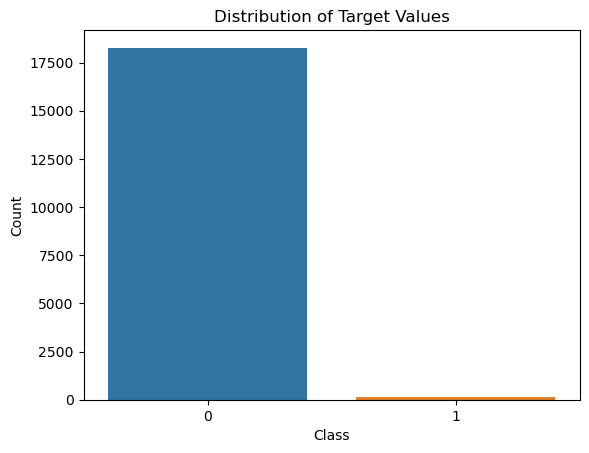

In [10]:
# Visualize target values
value_counts = df['y'].value_counts()
Target_Value_plot = sns.barplot(x=value_counts.index, y=value_counts.values)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Distribution of Target Values')
plt.show()

There is a heavy imbalance of target values in our dataset which might lead to a baised model so we need to balance them in order to avoid data imbalance and baised model.

### Relation between numerical columns and target column using scatter plots

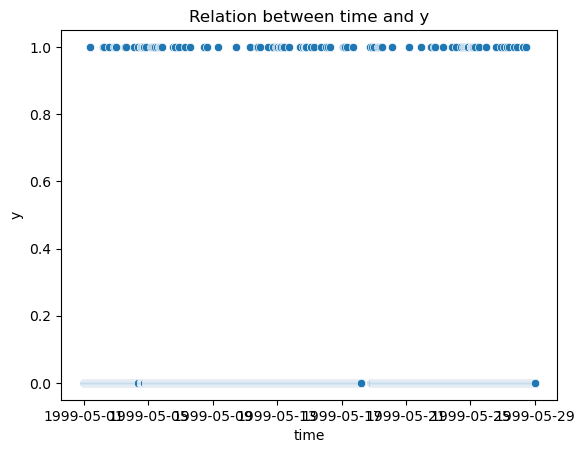

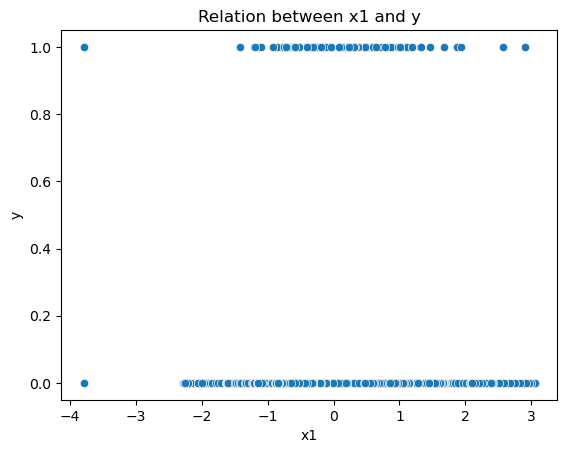

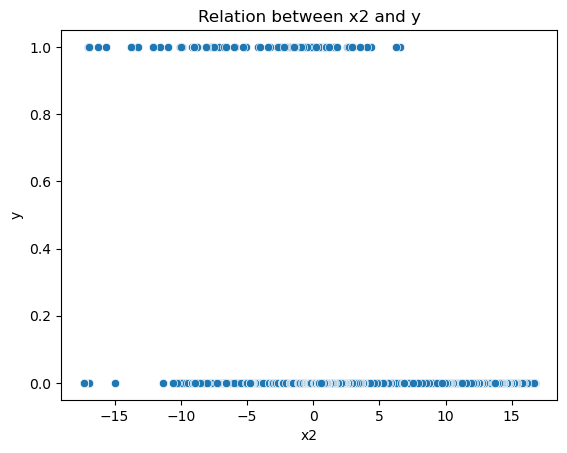

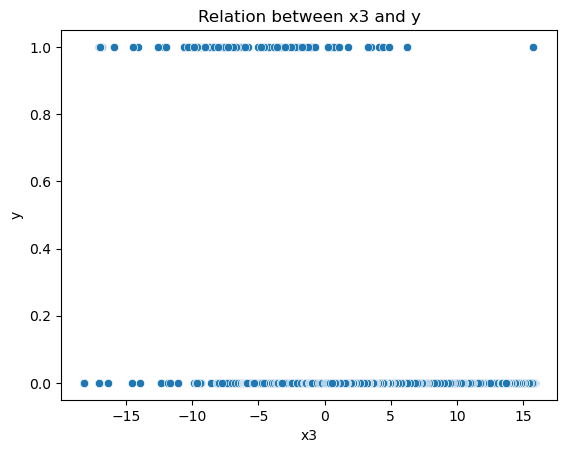

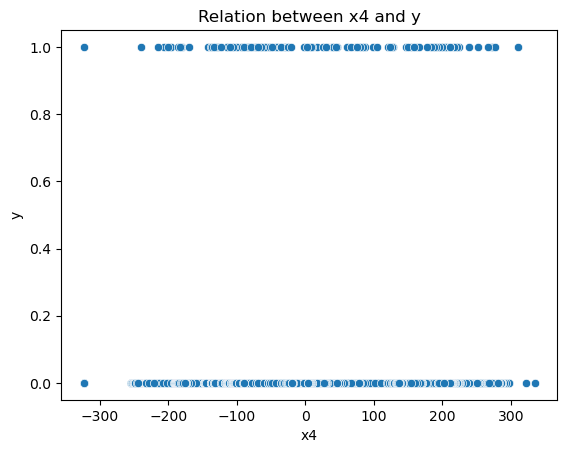

...

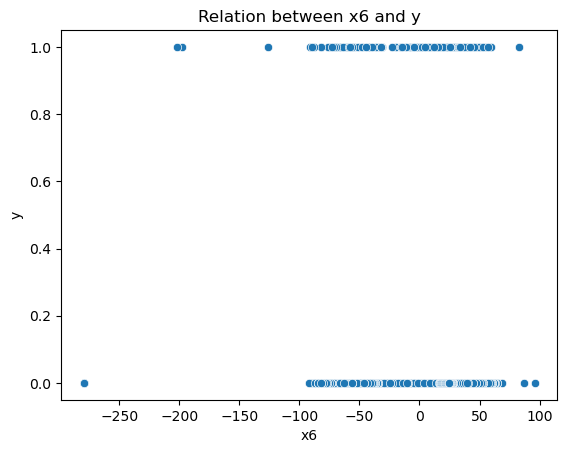

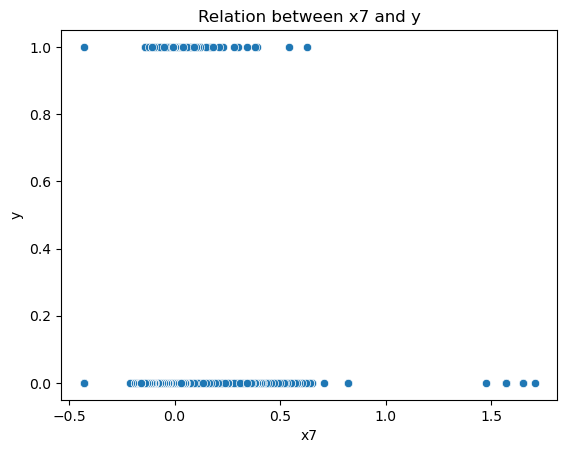

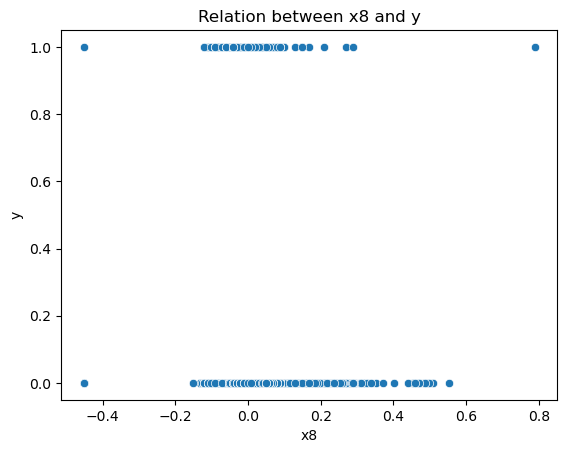

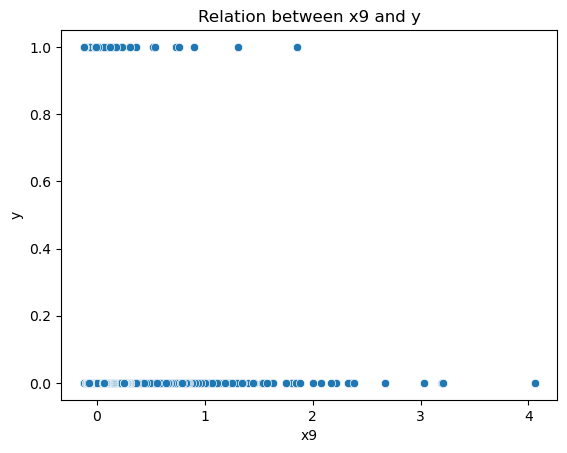

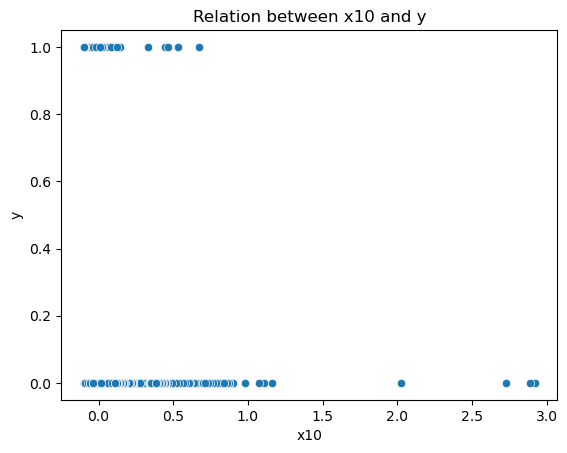

In [11]:
# select columns for plot
column = ['time', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10']

# loop through columns for plot
for col in column:
    scatter = sns.scatterplot(data=df, x=col, y='y')
    plt.title(f'Relation between {col} and y')
    plt.show()

From the above scatterplot we are not able to find any significant relationship between the features and the independent variable.

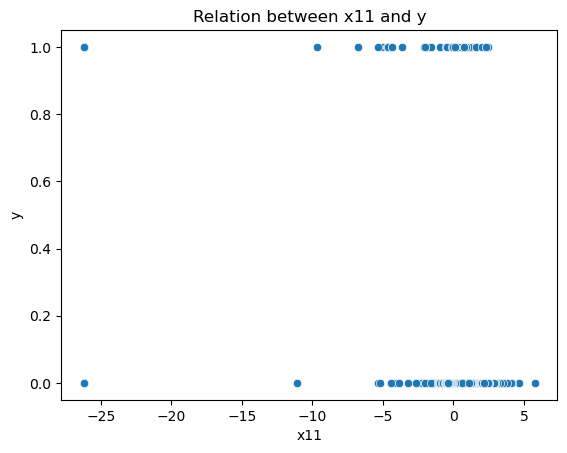

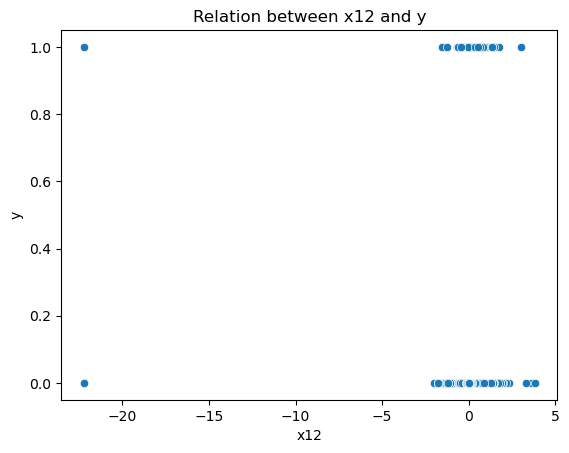

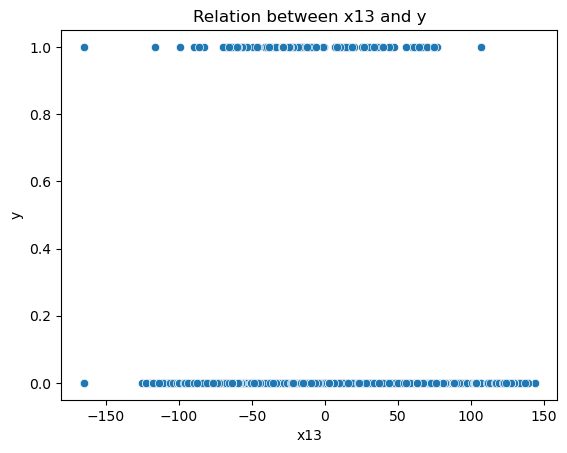

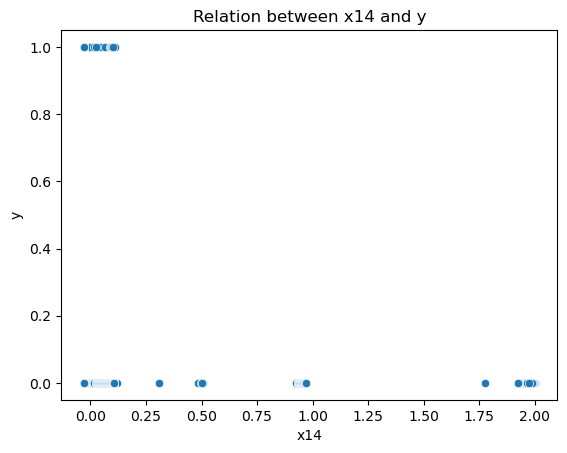

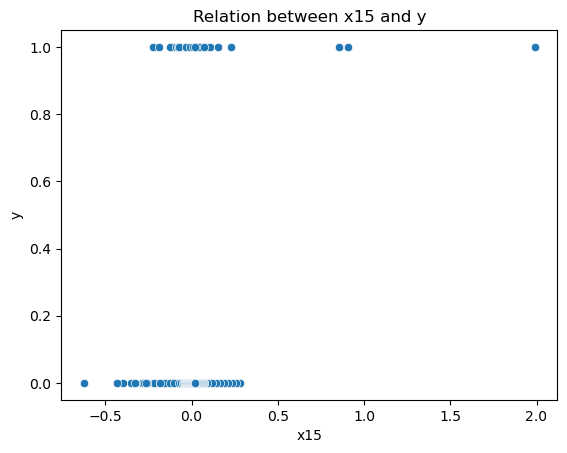

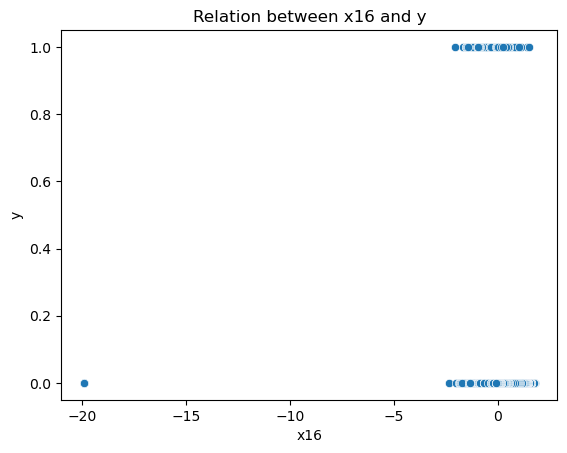

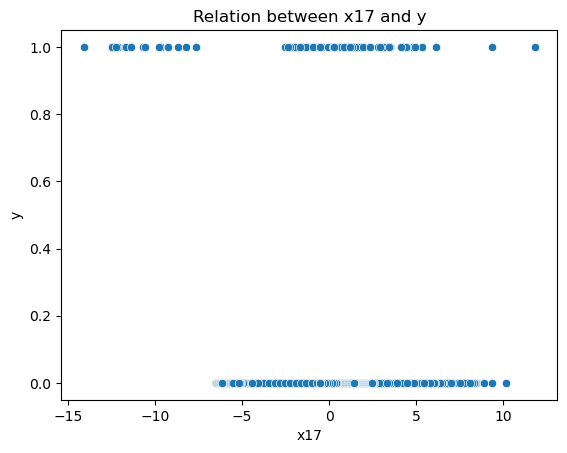

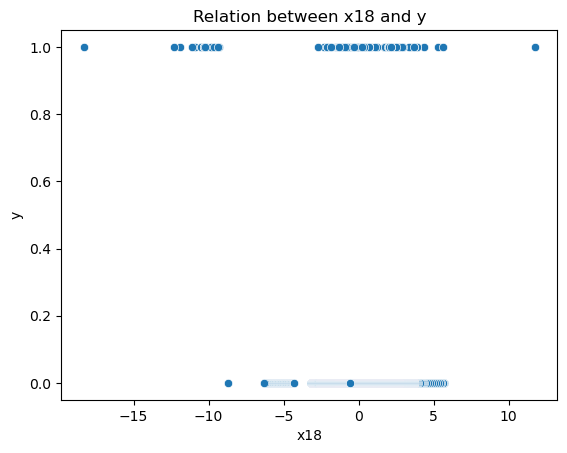

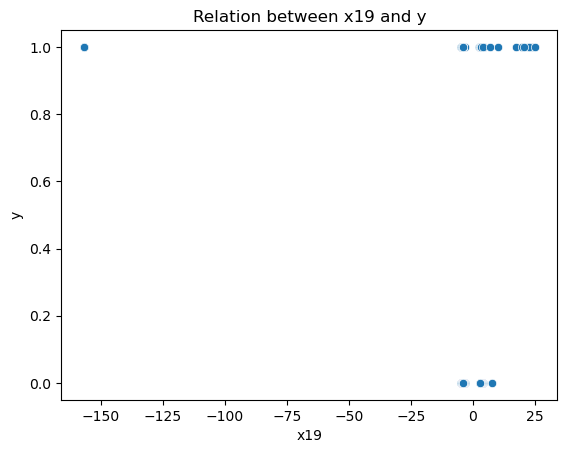

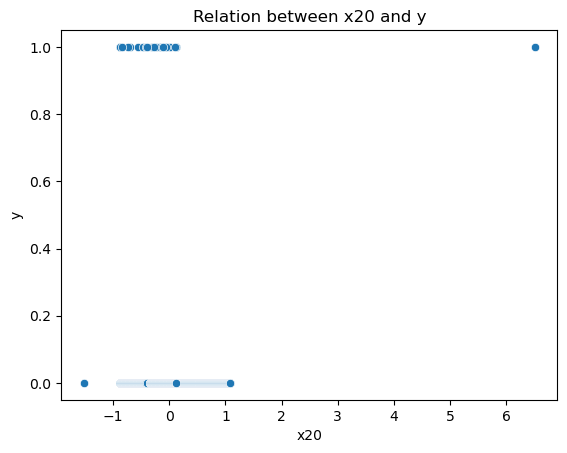

In [12]:
# select columns for plot
column = ['x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20']

# loop through columns for plot
for col in column:
    scatter = sns.scatterplot(data=df, x=col, y='y')
    plt.title(f'Relation between {col} and y')
    plt.show()

From the above scatterplot we are not able to find any significant relationship between the features and the independent variable.

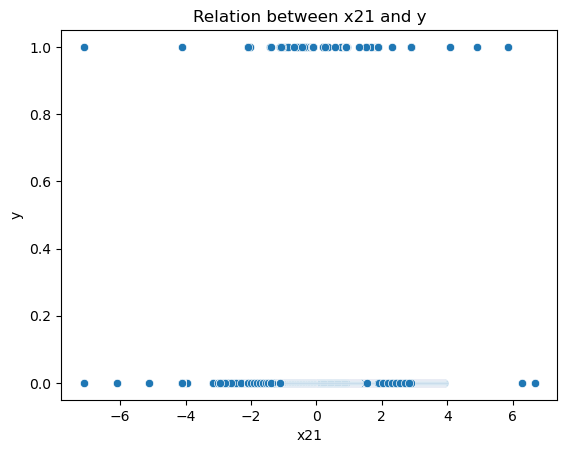

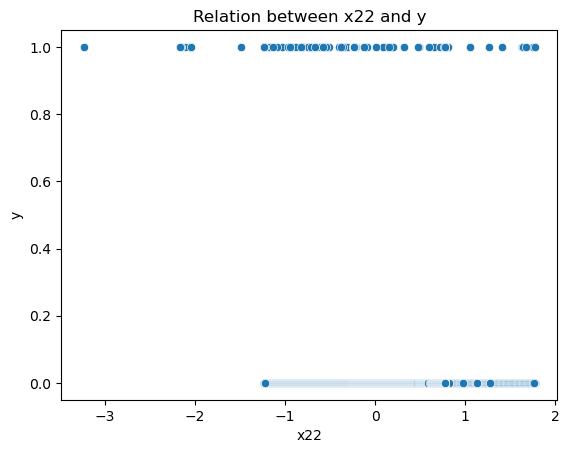

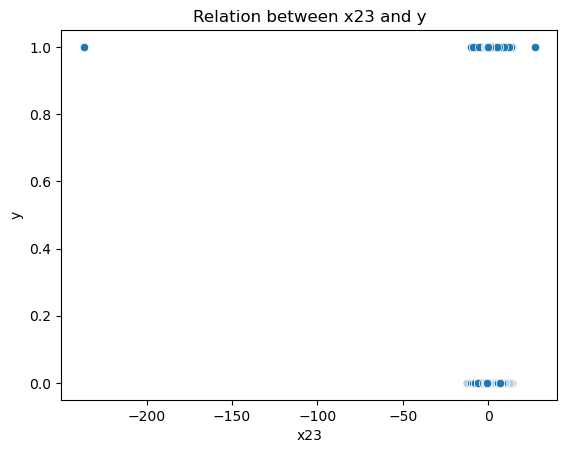

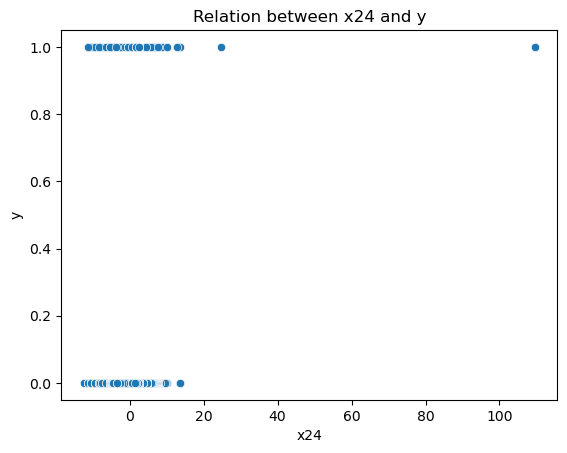

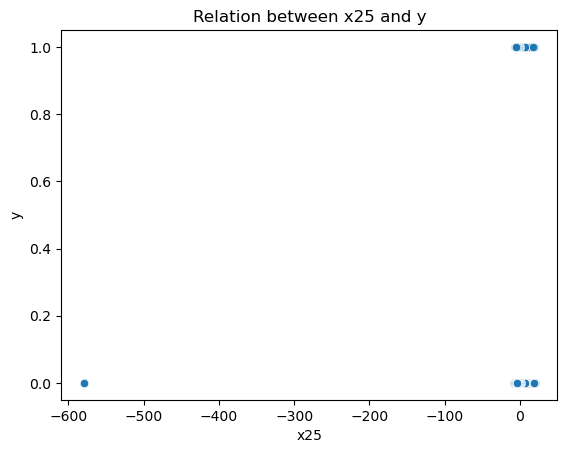

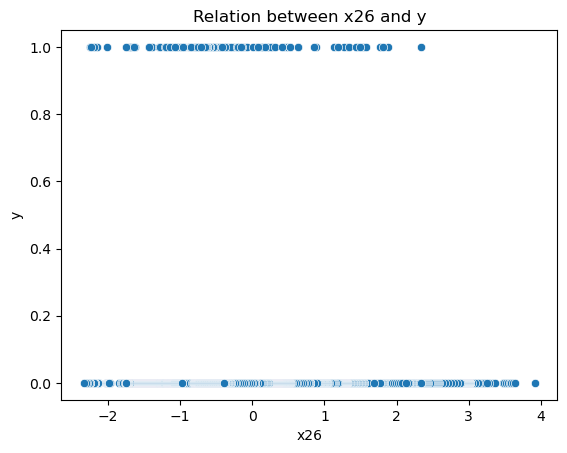

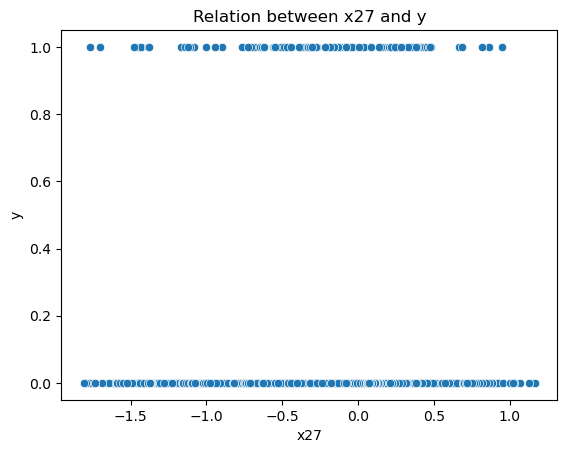

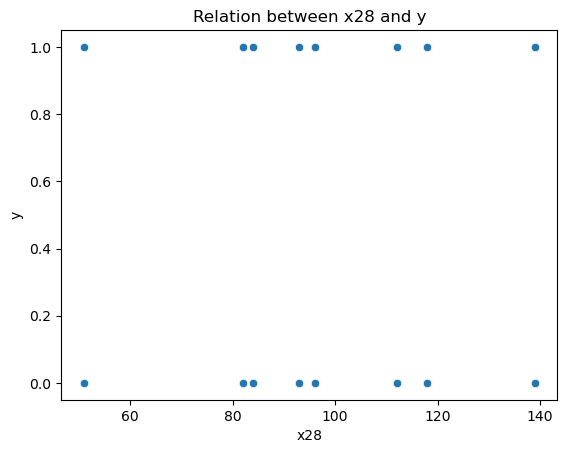

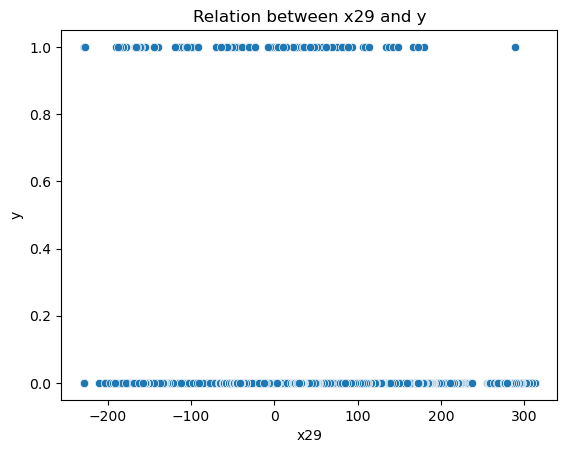

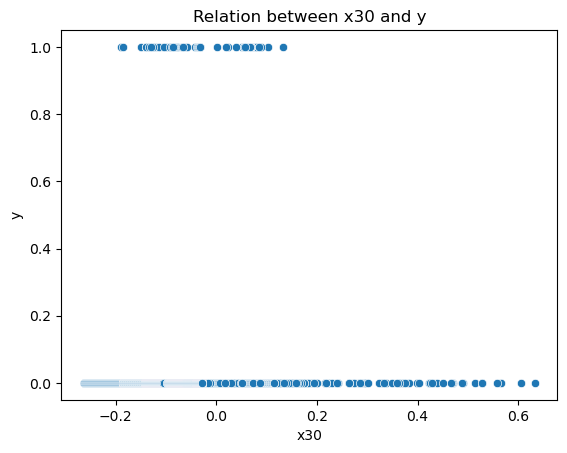

In [13]:
# select columns for plot
column = ['x21', 'x22', 'x23', 'x24', 'x25', 'x26', 'x27', 'x28', 'x29', 'x30']

# loop through columns for plot
for col in column:
    scatter = sns.scatterplot(data=df, x=col, y='y')
    plt.title(f'Relation between {col} and y')
    plt.show()

From the above scatterplot we are not able to find any significant relationship between the features and the independent variable.

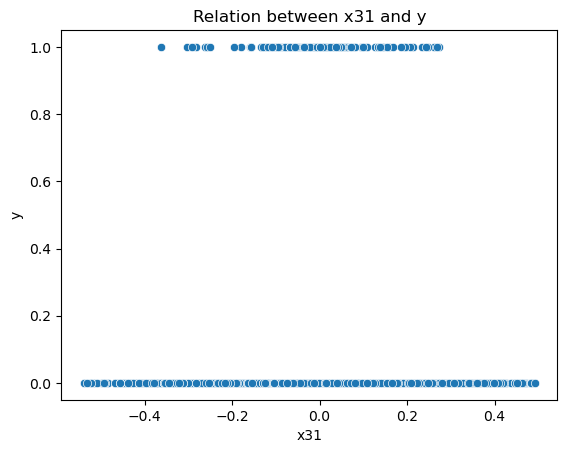

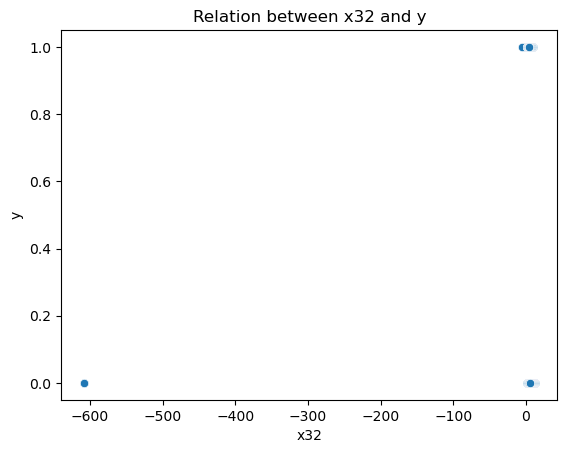

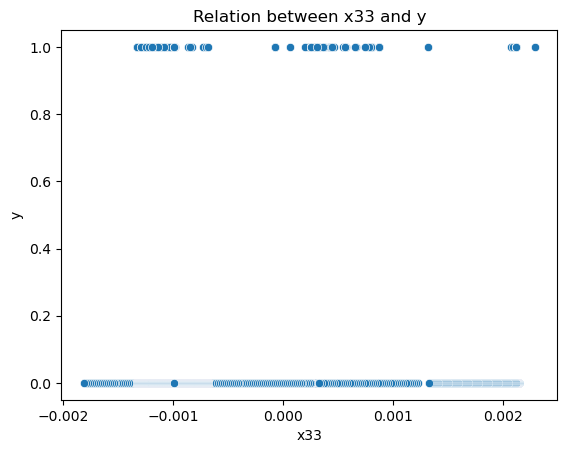

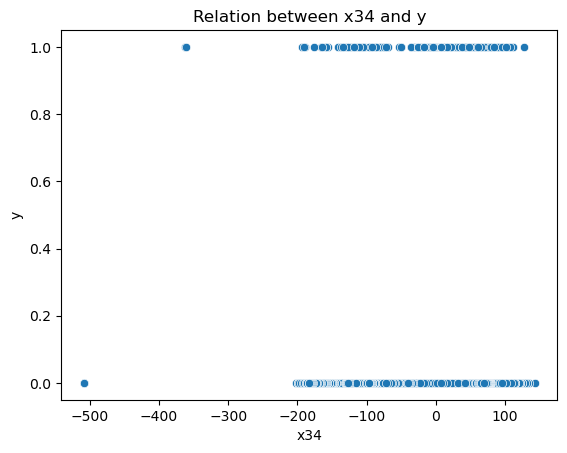

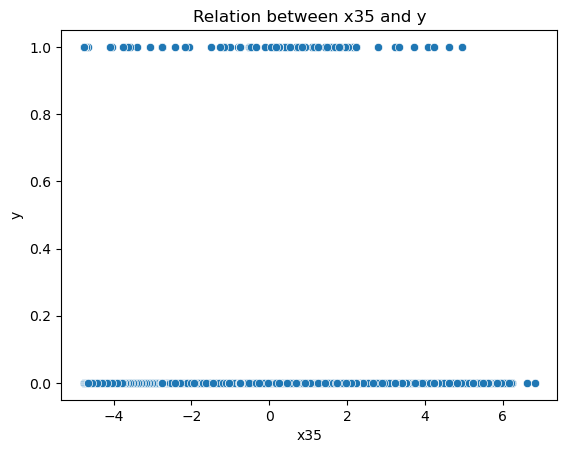

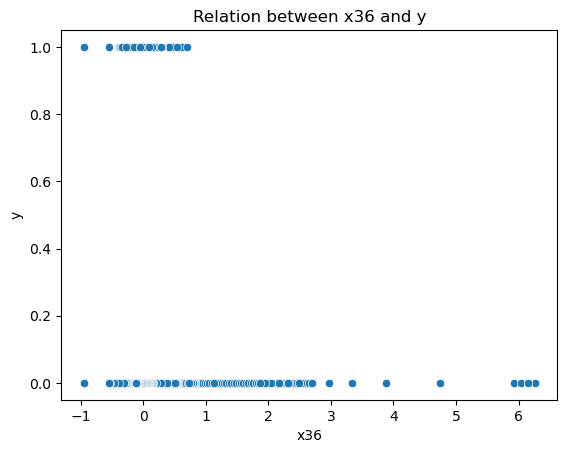

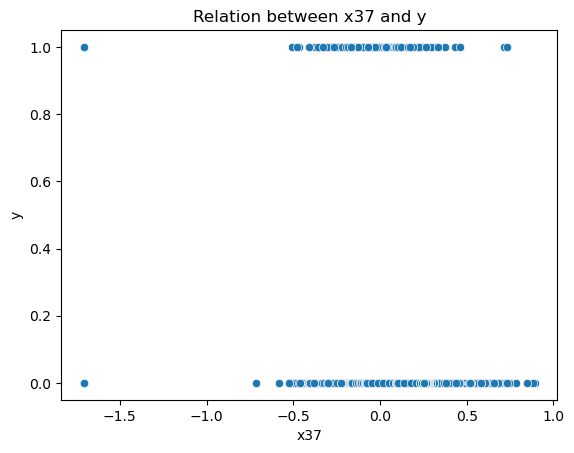

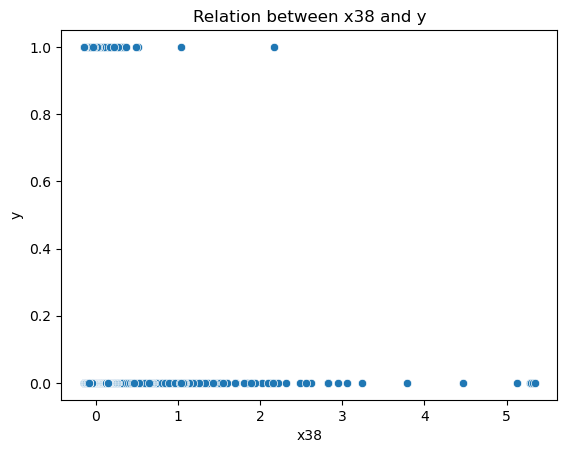

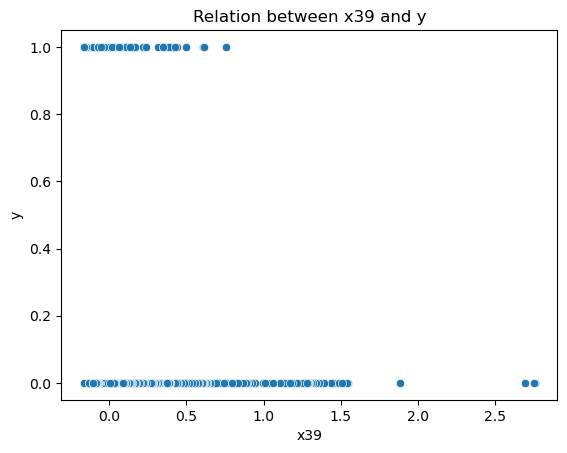

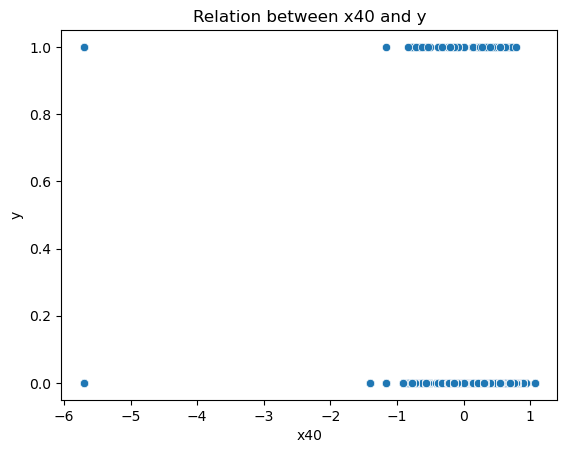

In [14]:
# select columns for plot
column = ['x31', 'x32', 'x33', 'x34', 'x35', 'x36', 'x37', 'x38', 'x39', 'x40']

# loop through columns for plot
for col in column:
    scatter = sns.scatterplot(data=df, x=col, y='y')
    plt.title(f'Relation between {col} and y')
    plt.show()

From the above scatterplot we are not able to find any significant relationship between the features and the independent variable.

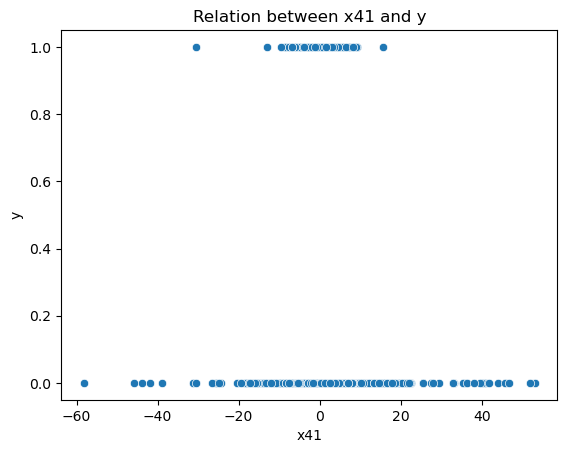

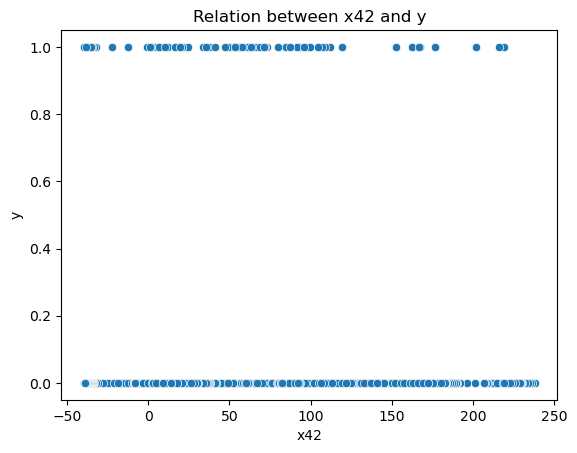

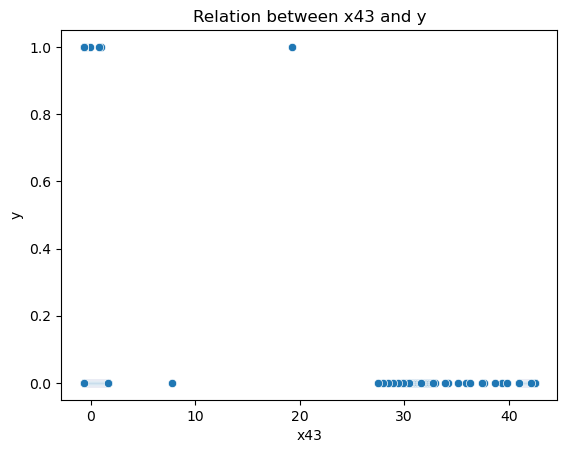

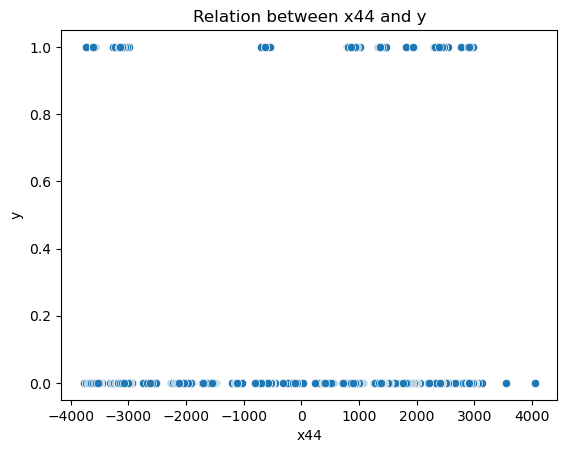

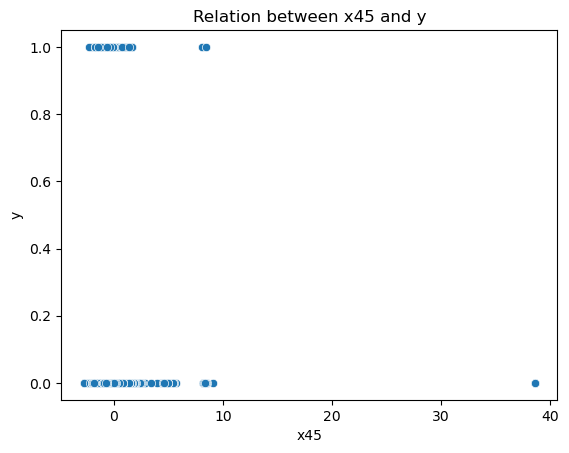

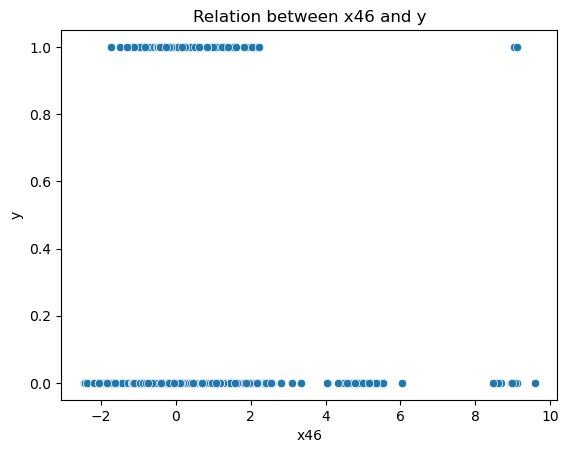

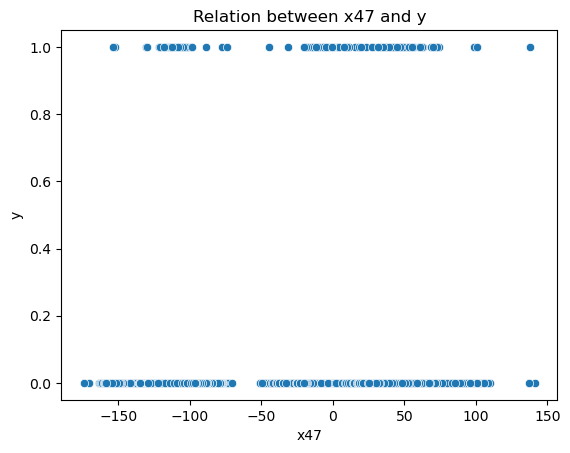

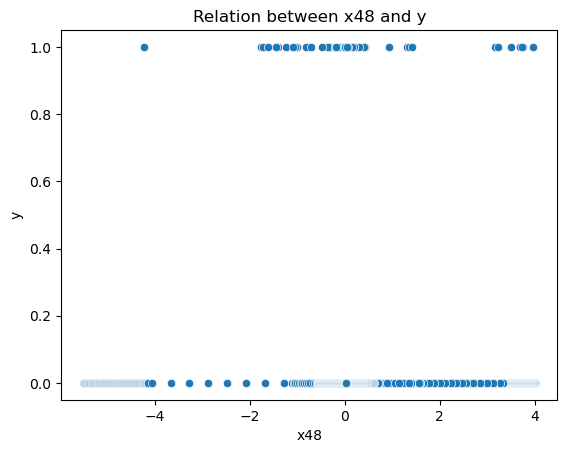

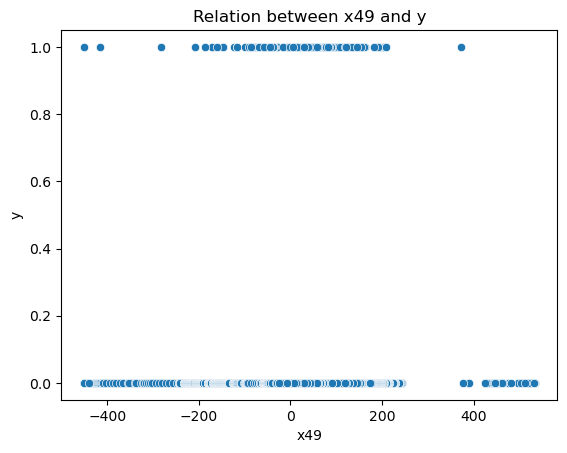

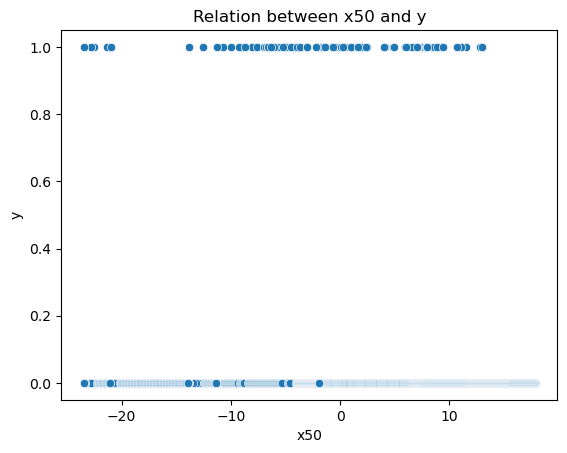

In [15]:
# select columns for plot
column = ['x41', 'x42', 'x43', 'x44', 'x45', 'x46', 'x47', 'x48', 'x49', 'x50']

# loop through columns for plot
for col in column:
    scatter = sns.scatterplot(data=df, x=col, y='y')
    plt.title(f'Relation between {col} and y')
    plt.show()

From the above scatterplot we are not able to find any significant relationship between the features and the independent variable.

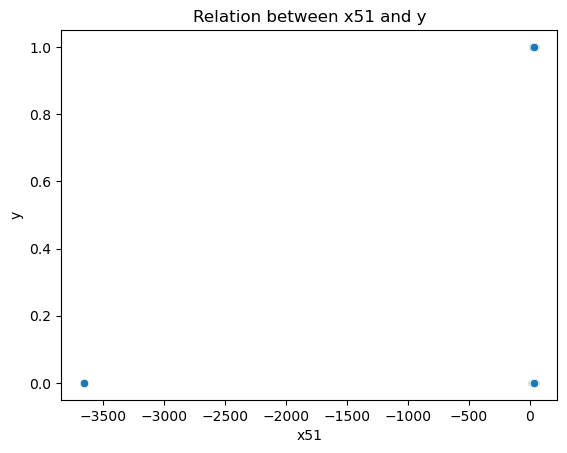

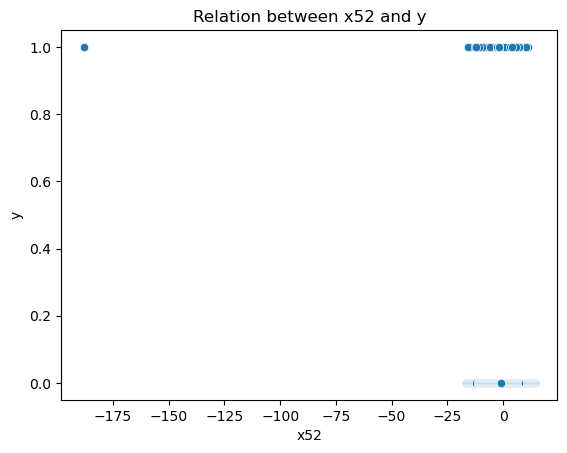

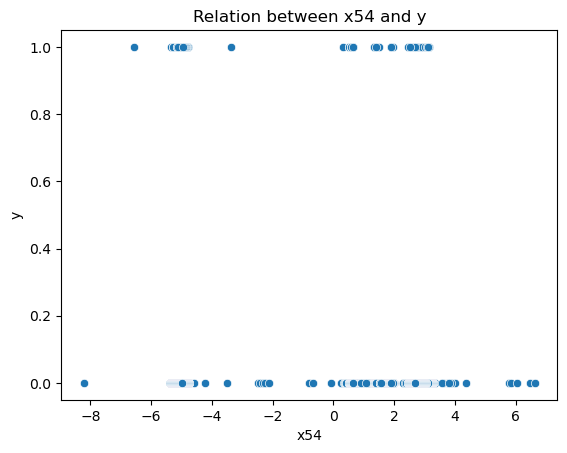

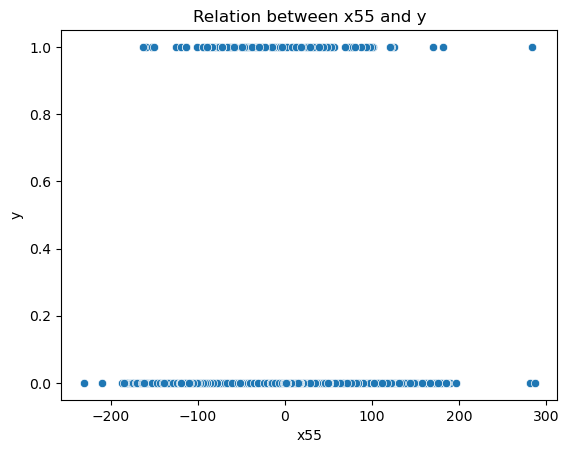

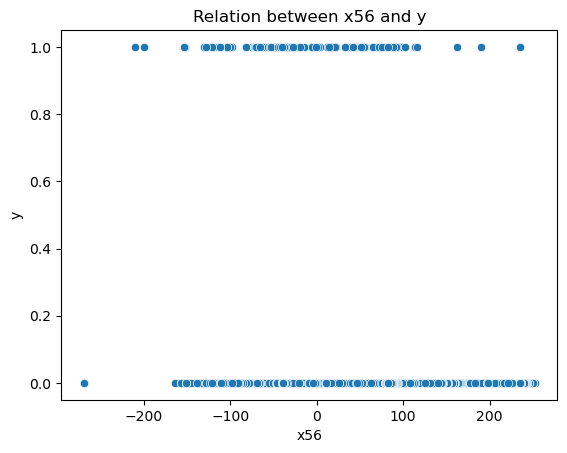

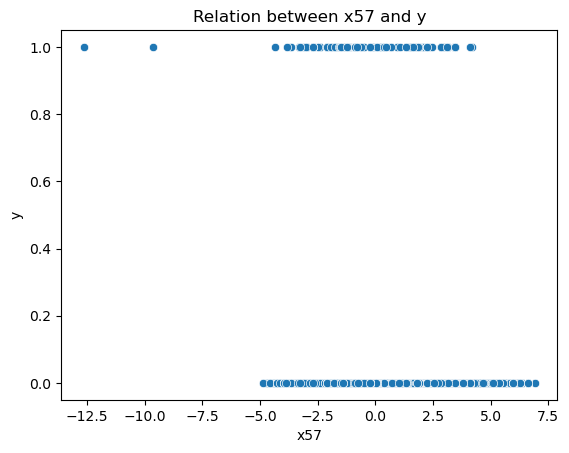

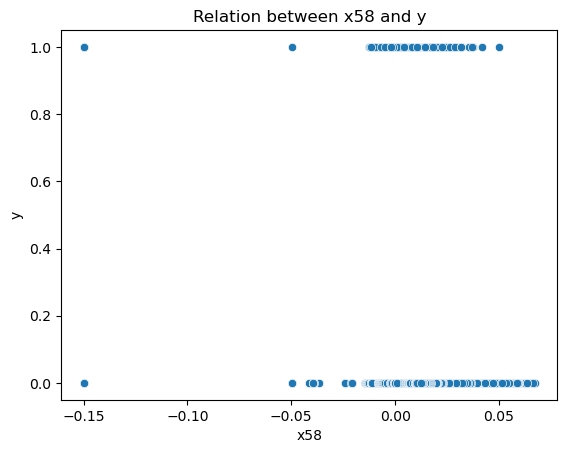

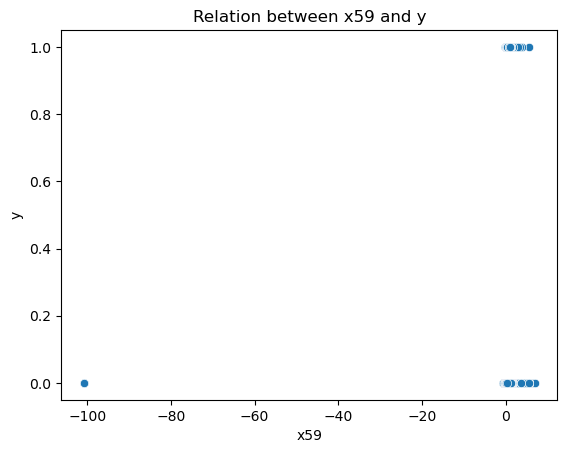

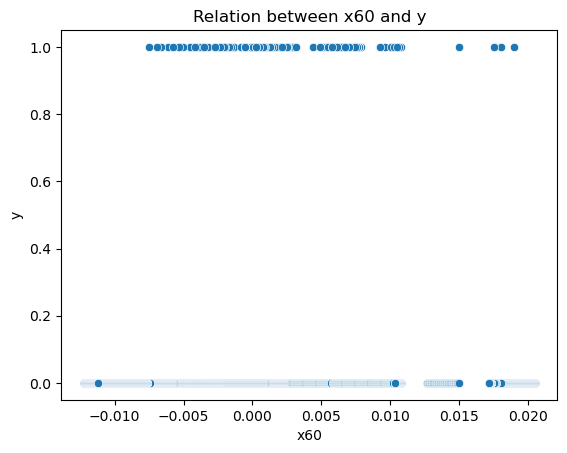

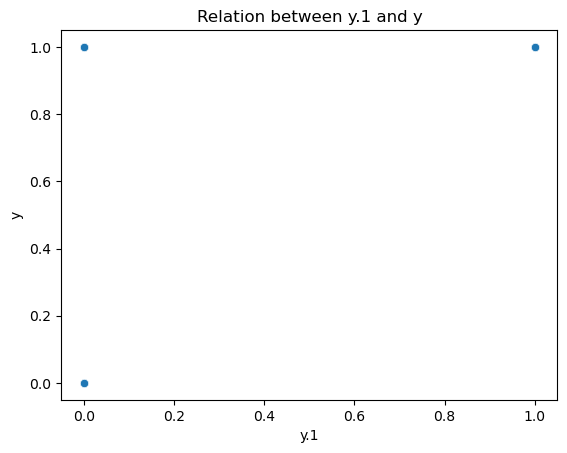

In [16]:
# select columns for plot
column = ['x51', 'x52', 'x54', 'x55', 'x56', 'x57', 'x58', 'x59', 'x60', 'y.1']

# loop through columns for plot
for col in column:
    scatter = sns.scatterplot(data=df, x=col, y='y')
    plt.title(f'Relation between {col} and y')
    plt.show()

From the above scatterplot we are not able to find any significant relationship between the features and the independent variable.

Now, we will create pairplots to check some more insights among the relationship between features and target variables.

### Relation between numerical columns and target column using pairplot

<Figure size 1000x800 with 0 Axes>

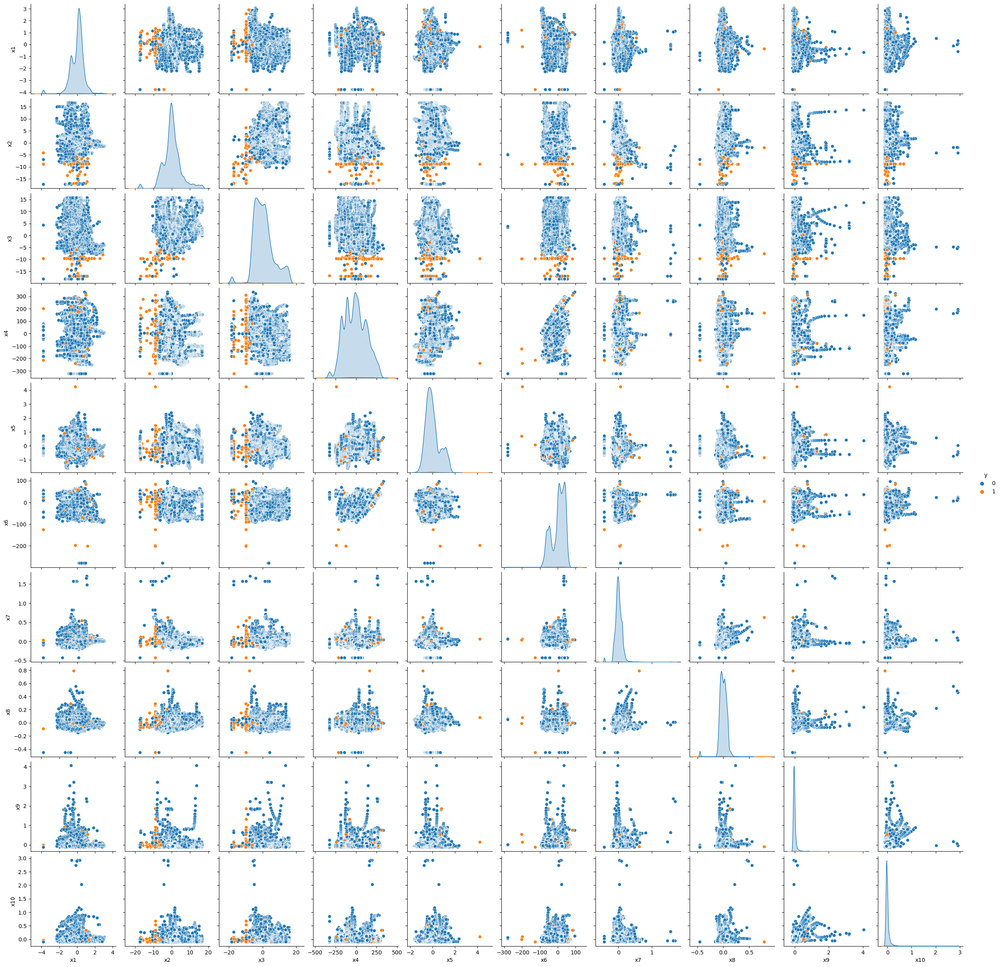

In [17]:
# set figure size
plt.figure(figsize=(10, 8))

# select columns for plot
sns.pairplot(df[['x1','x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'y']], hue='y')

# display the plot
plt.show()

From the above pairplot we are not able to find any significant relationship between the features and the independent variable. 

<Figure size 1000x800 with 0 Axes>

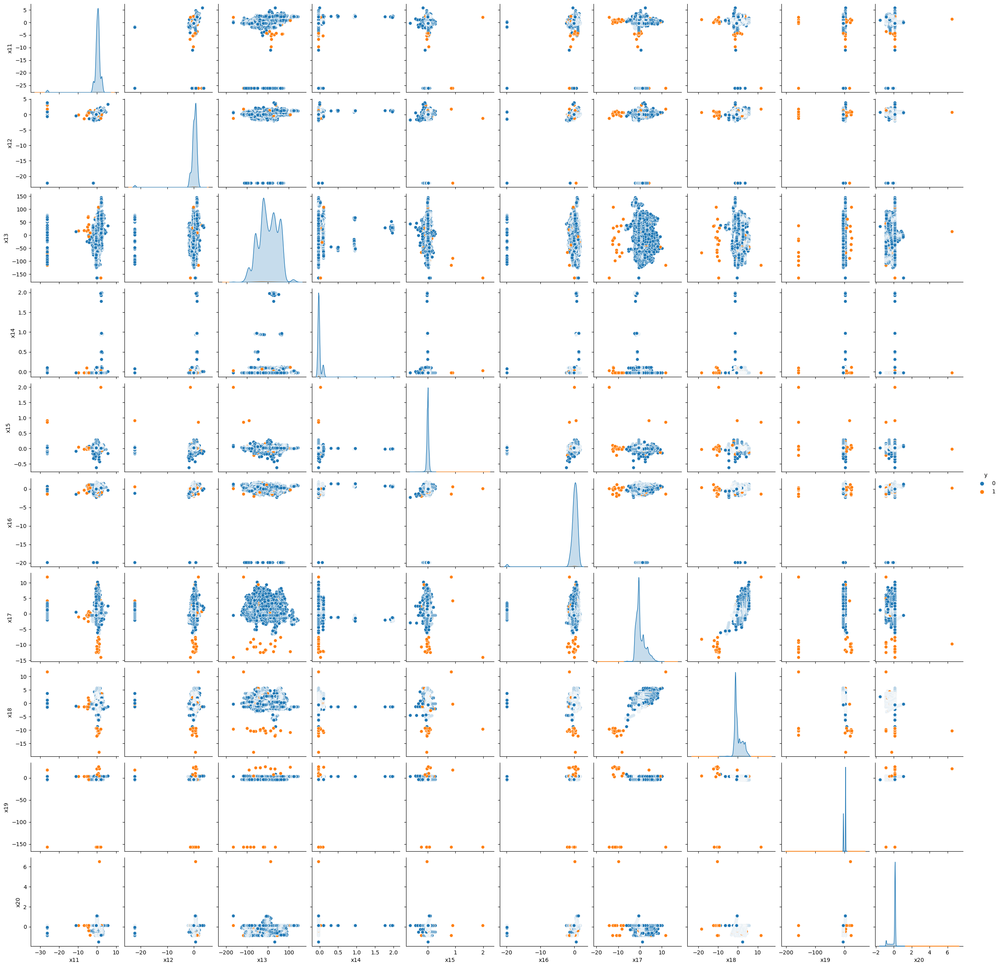

In [18]:
# set figure size
plt.figure(figsize=(10, 8))

# select columns for plot
sns.pairplot(df[['x11','x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20', 'y']], hue='y')

# display the plot
plt.show()

From the above pairplot we are not able to find any significant relationship between the features and the independent variable.

<Figure size 1000x800 with 0 Axes>

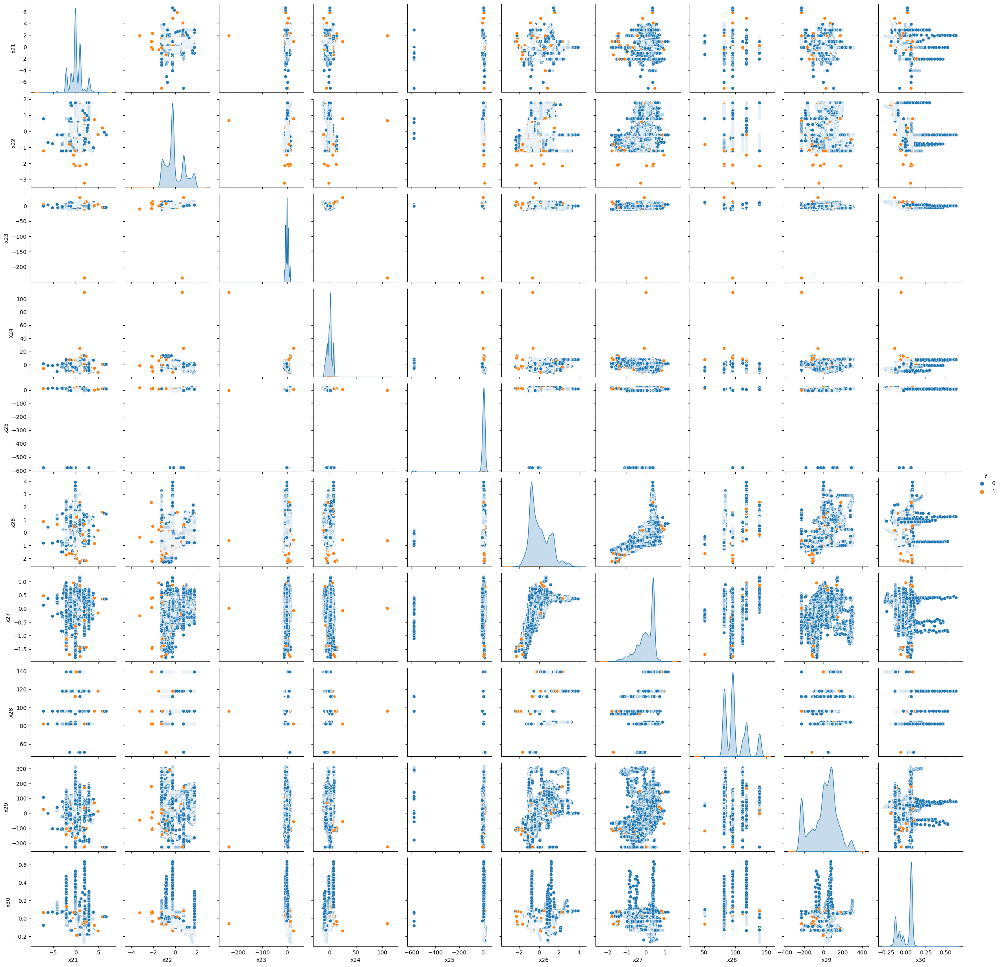

In [19]:
# set figure size
plt.figure(figsize=(10, 8))

# select columns for plot
sns.pairplot(df[['x21','x22', 'x23', 'x24', 'x25', 'x26', 'x27', 'x28', 'x29', 'x30', 'y']], hue='y')

# display the plot
plt.show()

From the above pairplot we are not able to find any significant relationship between the features and the independent variable.

<Figure size 1000x800 with 0 Axes>

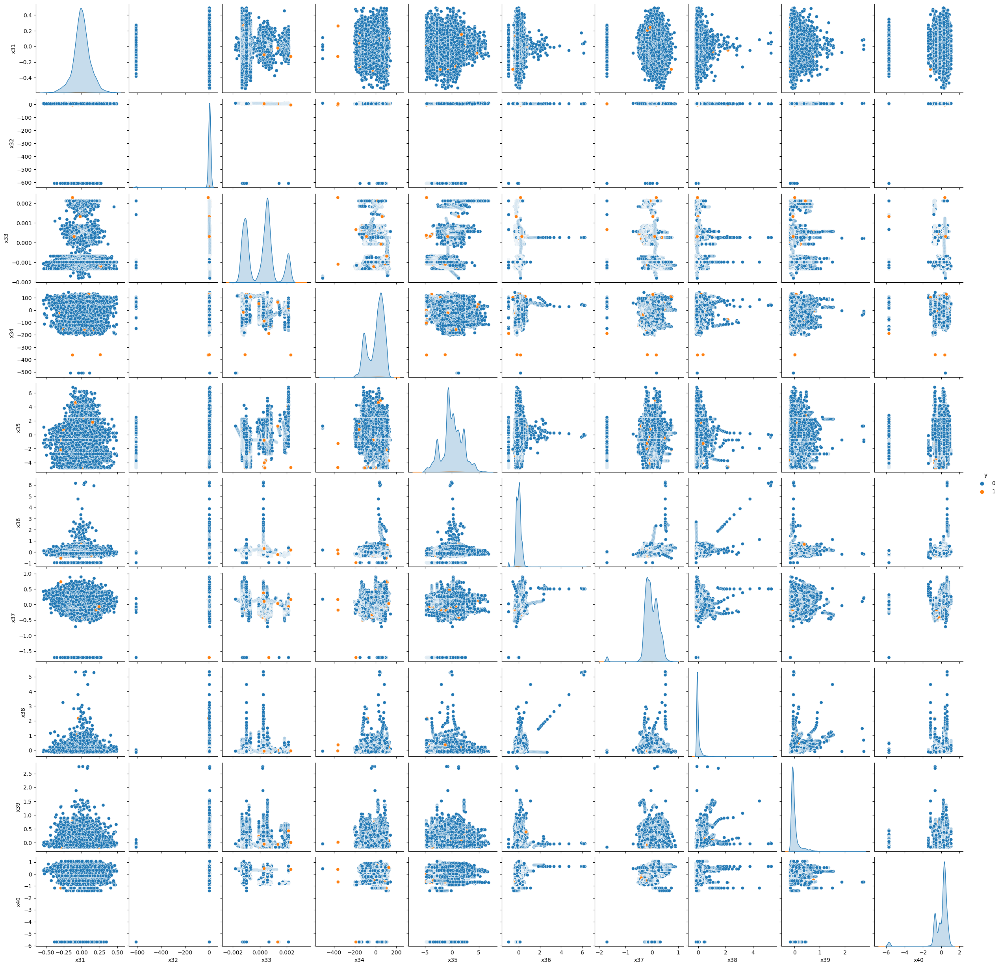

In [20]:
# set figure size
plt.figure(figsize=(10, 8))

# select columns for plot
sns.pairplot(df[['x31','x32', 'x33', 'x34', 'x35', 'x36', 'x37', 'x38', 'x39', 'x40', 'y']], hue='y')

# display the plot
plt.show()

From the above pairplot we are not able to find any significant relationship between the features and the independent variable.

<Figure size 1000x800 with 0 Axes>

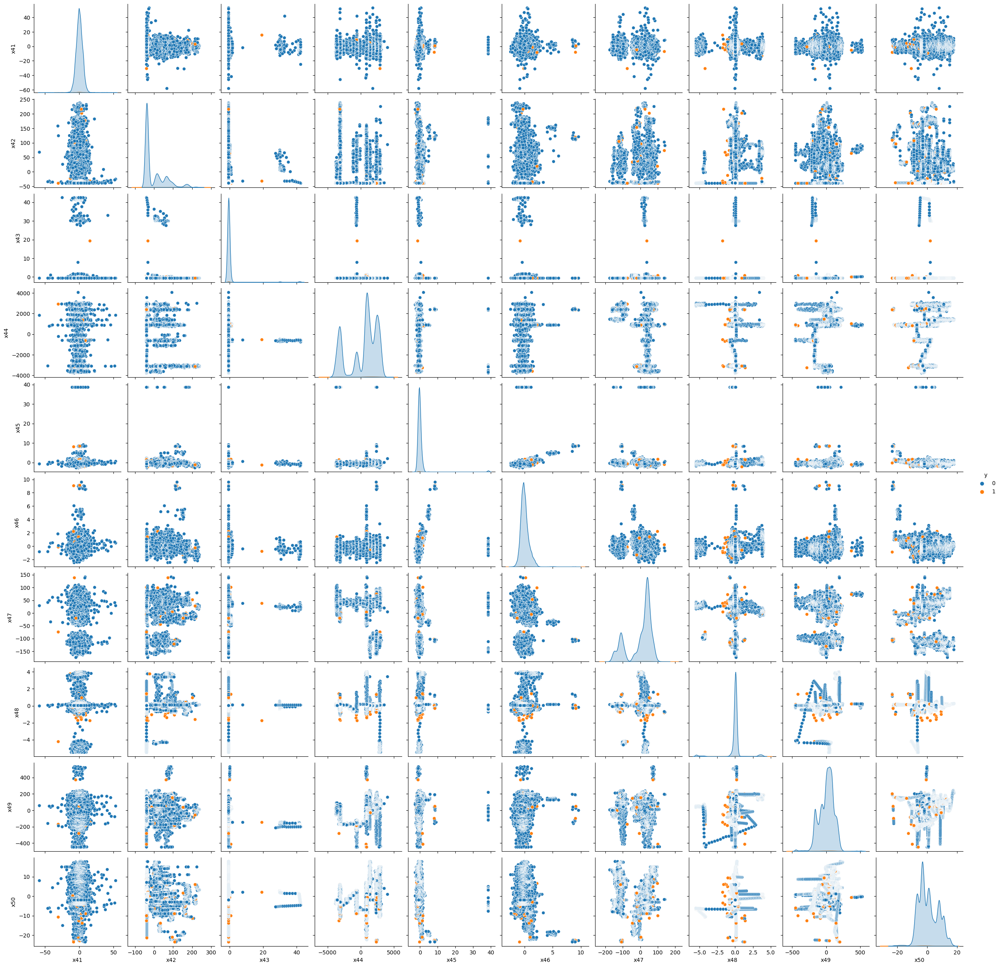

In [21]:
# set figure size
plt.figure(figsize=(10, 8))

# select columns for plot
sns.pairplot(df[['x41','x42', 'x43', 'x44', 'x45', 'x46', 'x47', 'x48', 'x49', 'x50', 'y']], hue='y')

# display the plot
plt.show()

From the above pairplot we are not able to find any significant relationship between the features and the independent variable.

<Figure size 1000x800 with 0 Axes>

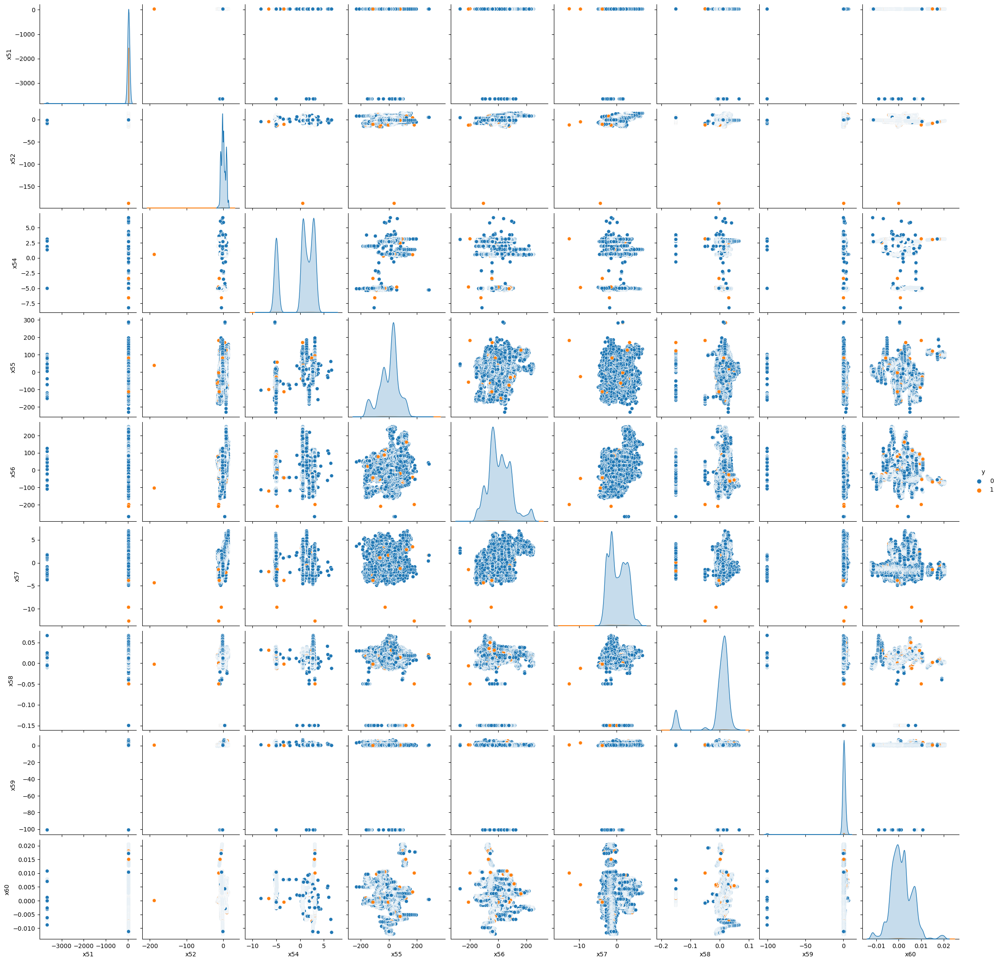

In [22]:
# set figure size
plt.figure(figsize=(10, 8))

# select columns for plot
sns.pairplot(df[['x51','x52', 'x54', 'x55', 'x56', 'x57', 'x58', 'x59', 'x60', 'y']], hue='y')

# display the plot
plt.show()

From the above pairplot we are not able to find any significant relationship between the features and the independent variable.

<a id="enc"></a>
# 2.5 Data Cleaning and Feature engineering

In [23]:
# Select columns
columns_to_drop = ['time', 'y.1']

# Drop columns
for col in columns_to_drop:
    df = df.drop([col], axis=1)

# Display dataset
df.head()

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x54,x55,x56,x57,x58,x59,x60
0,0,0.376665,-4.596435,-4.095756,13.497687,-0.118830,-20.669883,0.000732,-0.061114,-0.059966,-0.038189,0.877951,-0.052959,-13.306135,0.101068,0.041800,0.199901,-2.327329,-0.944167,3.075199,0.123154,-0.104334,-0.570710,-9.784456,0.355960,15.842819,-0.451973,-0.105282,96,-134.27786,0.058726,-0.021645,9.366755,0.002151,-69.187583,4.232571,-0.225267,-0.196872,-0.072449,-0.103732,-0.720746,-5.412436,76.679042,-0.632727,1351.63286,-0.657096,-0.434947,-108.77597,0.084856,10.210182,11.295155,29.984624,10.091721,-4.936434,-24.590146,18.515436,3.473400,0.033444,0.953219,0.006076
1,0,0.475720,-4.542502,-4.018359,16.230659,-0.128733,-18.758079,0.000732,-0.061114,-0.059966,-0.038189,0.873273,-0.014244,-13.306135,0.101108,0.041447,0.304313,-2.340627,-0.939994,3.075199,0.123154,-0.104334,-0.574861,-9.784456,0.360160,16.491684,-0.450450,-0.092430,96,-134.48019,0.058759,-0.004579,9.350215,0.002149,-68.585197,4.311490,-0.225267,-0.196872,-0.059103,-0.083895,-0.720746,-8.343222,78.181598,-0.632727,1370.37895,-0.875629,-1.125819,-108.84897,0.085146,12.534340,11.290761,29.984624,10.095871,-4.937179,-32.413266,22.760065,2.682933,0.033536,1.090502,0.006083
2,0,0.363848,-4.681394,-4.353147,14.127997,-0.138636,-17.836632,0.010803,-0.061114,-0.030057,-0.018352,1.004910,0.065150,-9.619596,0.101148,0.041095,0.252839,-2.353925,-0.935824,3.075199,0.123154,-0.104334,-0.579013,-9.784456,0.364356,15.972885,-0.448927,-0.097144,96,-133.94659,0.058791,-0.084658,9.037409,0.002148,-67.838187,4.809914,-0.225267,-0.186801,-0.048696,-0.073823,-0.720746,-1.085166,79.684154,-0.632727,1368.12309,-0.037775,-0.519541,-109.08658,0.085436,18.582893,11.286366,29.984624,10.100265,-4.937924,-34.183774,27.004663,3.537487,0.033629,1.840540,0.006090
3,0,0.301590,-4.758934,-4.023612,13.161566,-0.148142,-18.517601,0.002075,-0.061114,-0.019986,-0.008280,0.930037,-0.067199,-15.196531,0.101188,0.040742,0.072873,-2.367223,-0.931651,3.075199,0.123154,-0.104334,-0.583165,-9.784456,0.368556,15.608688,-0.447404,-0.160073,96,-134.00259,0.058824,-0.055118,9.020625,0.002146,-67.091148,5.308343,-0.225267,-0.186801,-0.047017,-0.063752,-0.720746,6.172891,81.186702,-0.632727,1365.69145,-0.987410,0.674524,-109.56277,0.085726,17.719032,11.281972,29.984624,10.104660,-4.938669,-35.954281,21.672449,3.986095,0.033721,2.554880,0.006097
4,0,0.265578,-4.749928,-4.333150,15.267340,-0.155314,-17.505913,0.000732,-0.061114,-0.030057,-0.008280,0.828410,-0.018472,-14.609266,0.101229,0.040390,0.171033,-2.380521,-0.927478,3.075199,0.123154,-0.104334,-0.587316,-9.784456,0.372756,15.606125,-0.445879,-0.131630,96,-133.14571,0.058856,-0.153851,9.344233,0.002145,-65.991813,5.806771,-0.225267,-0.186801,-0.057088,-0.063752,-0.720746,-3.379599,82.689258,-0.632727,1363.25786,-0.238445,-0.063044,-110.03891,0.086016,16.855202,11.277577,29.984624,10.109054,-4.939414,-37.724789,21.907251,3.601573,0.033777,1.410494,0.006105


Since the above two columns 'time' and 'y.1' are not relevant to our dataset nor it will help in our further data processing so we have dropped them.

<a id="spl"></a>
# 2.6 Outlier Detection

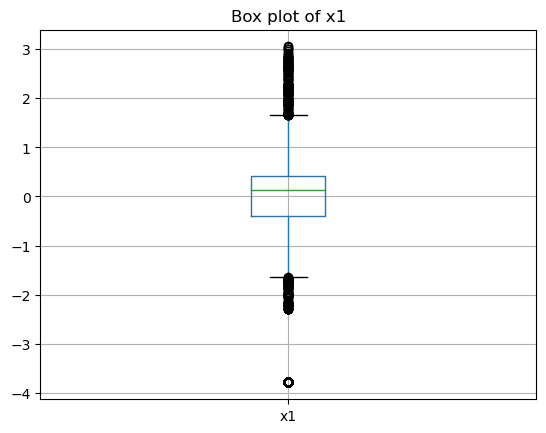

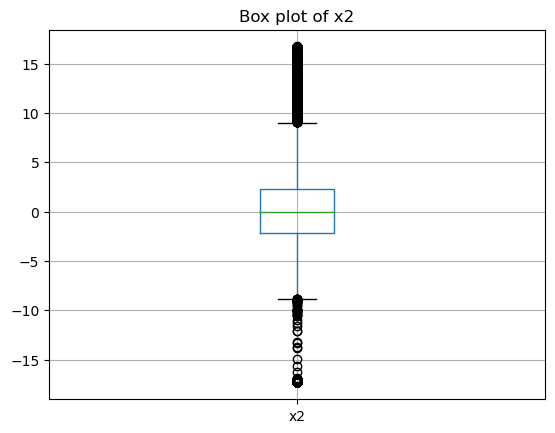

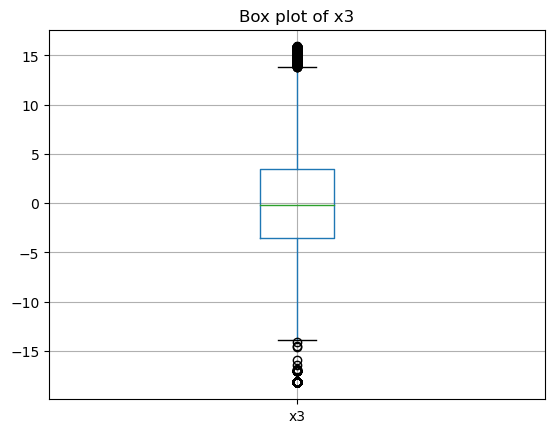

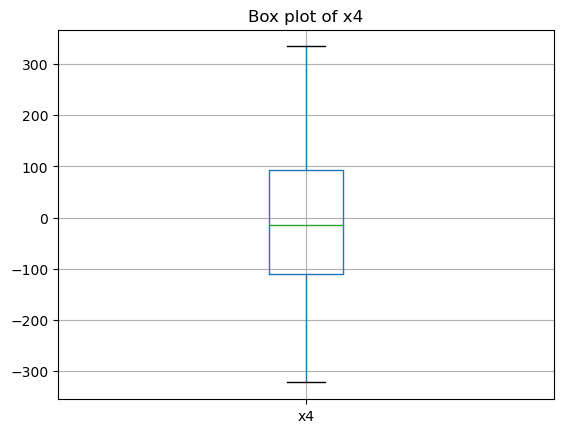

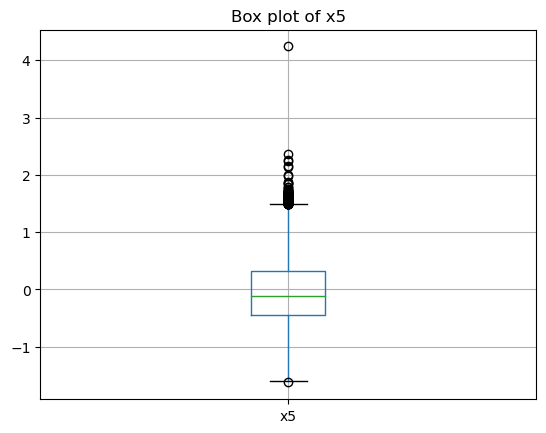

...

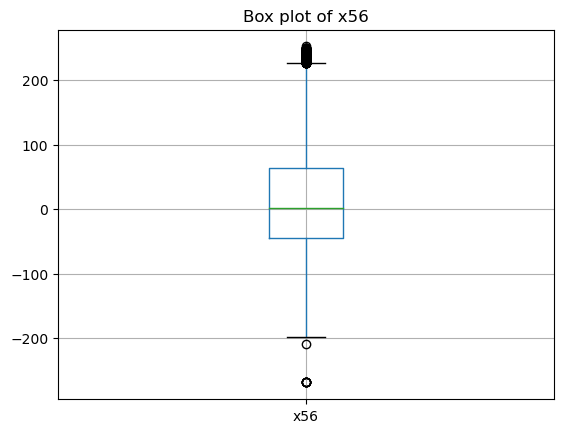

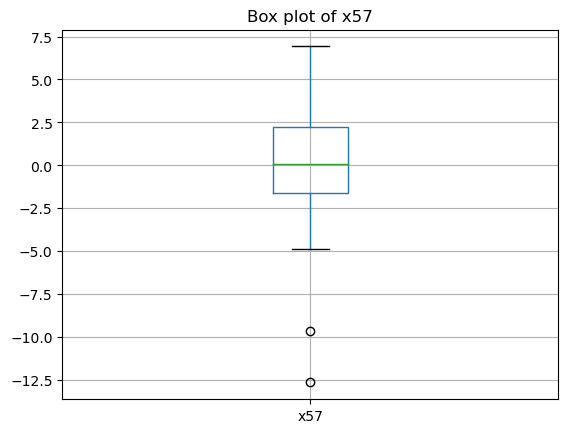

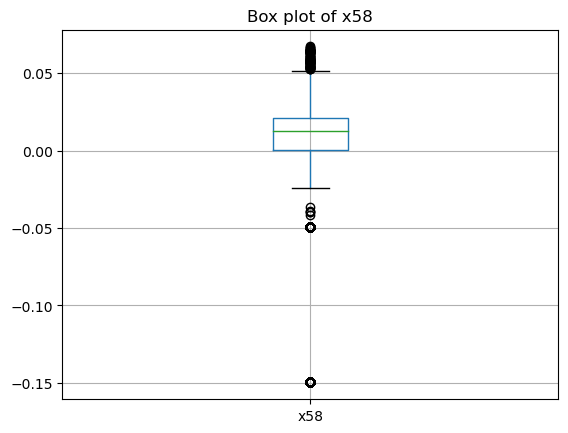

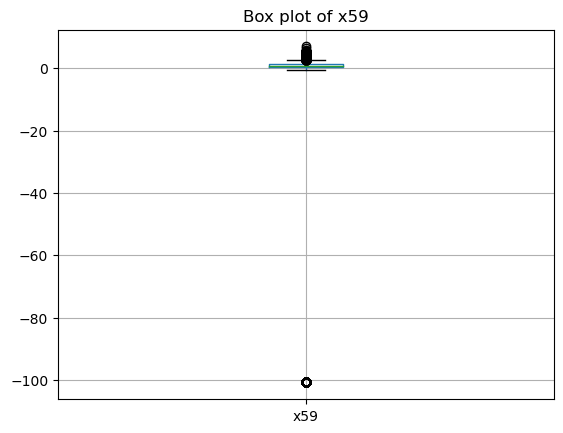

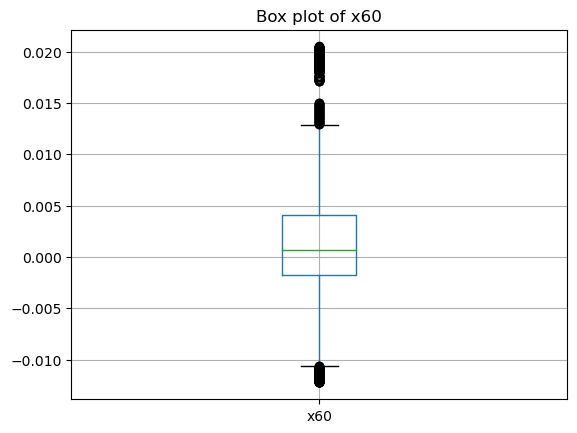

In [24]:
# Check for Outliers
df_col = df.drop(['y'], axis=1)

# loop through the columns and visualize boxplot
for column in df_col:
    plt.figure()
    df.boxplot(column=column)
    plt.title(f'Box plot of {column}')
    plt.show()

From the above boxplot diagrams, we can clearly notice that our dataset contain some outliers. So, we need to handle them efficiently without any data loss.

<a id="abc"></a>
# 2.7 Outlier Treatment

In [25]:
# Outlier Capping (Winsorizing)
columns = df.drop(['y'], axis=1)

# Loop through each column and cap outliers
for col in columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_threshold = Q1 - 3 * IQR
    upper_threshold = Q3 + 3 * IQR

    # Cap values below the lower threshold and above the upper threshold
    df[col] = df[col].apply(lambda x: lower_threshold if x < lower_threshold else upper_threshold if x > upper_threshold else x)

Here, removing outliers would not be a better option since our task is anomaly detection, removal of outliers could harm model performance, as these outliers may actually represent anomalies. So, we will go ahead with outlier capping(winsorizing) because it allows us to handle extreme values without losing potential anomalies.

Now, we will check the correlation between all the features. 

### Check for Correlation among the features

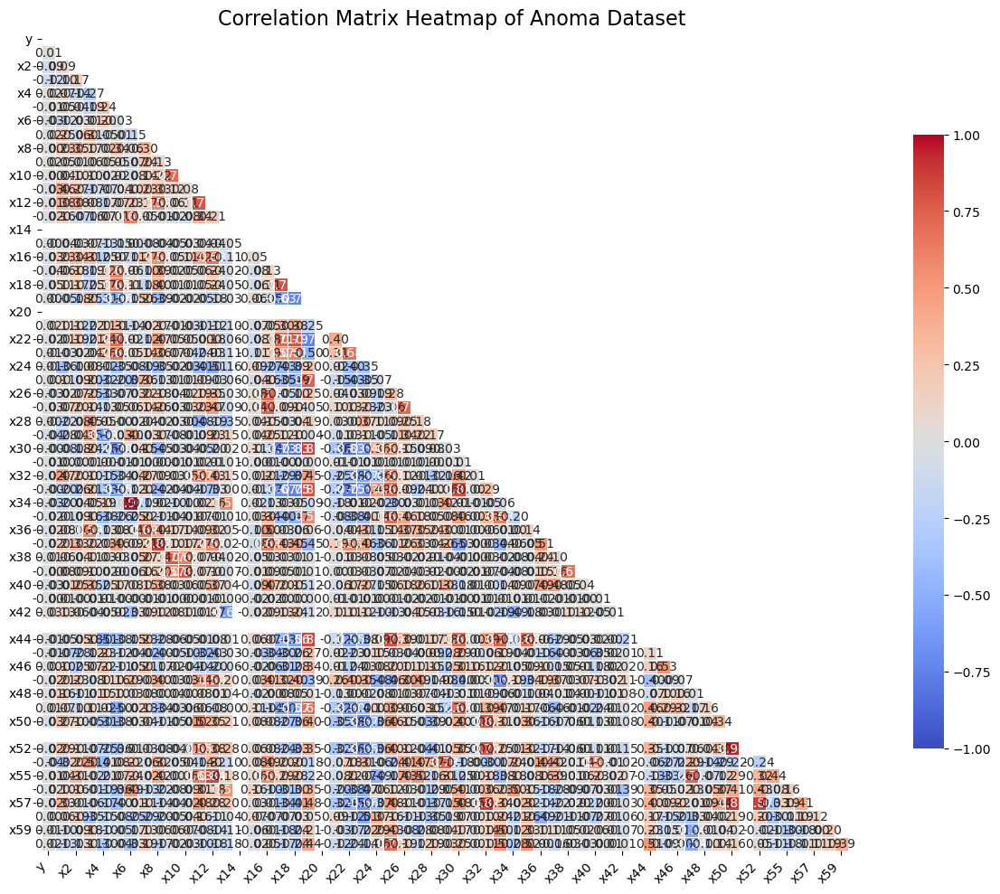

In [98]:
# Correlation matrix
cor_matrix = df.corr()

# Mask to hide upper triangle
mask = np.triu(np.ones_like(cor_matrix, dtype=bool))

# Set up the figure
plt.figure(figsize=(12, 10))

# Customize heatmap
sns.heatmap(data=cor_matrix, mask=mask, cmap="coolwarm", annot=True, fmt=".2f", 
            linewidths=0.5, cbar_kws={"shrink": 0.75}, vmin=-1, vmax=1)

# Add title and improve layout
plt.title('Correlation Matrix Heatmap of Anoma Dataset', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)

# Show plot
plt.tight_layout()
plt.show()

From the above heatmap visualization we can clearly check some columns are highly correlated with each other e.g x34 and x6 and other columns like x50 and x52.

<a id="aab"></a>
# 2.8 Balancing the dataset

In [27]:
# Select features and target variables
X = df.drop(['y'], axis=1)
y = df['y']

# Count the target values and their average 
count_0 = y.value_counts()[0]
count_1 = y.value_counts()[1]
average_count = int((count_0 + count_1) / 2)

# Create pipeline for over and under sampler SMOTE
resampling_pipeline = Pipeline([
    ('oversampler', SMOTE(sampling_strategy={1: average_count}, random_state=42)),
    ('undersample', RandomUnderSampler(sampling_strategy={0: average_count}, random_state=42))
])

# Apply the fit_resample
X_resampled, y_resampled = resampling_pipeline.fit_resample(X, y)

# Concat the resampled data and display
X, y = X_resampled, y_resampled
df_resampled = pd.concat([X, y], axis=1)
df_resampled.head(5)

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x54,x55,x56,x57,x58,x59,x60,y
0,0.354082,5.968555,-3.769824,-113.755640,0.954763,-40.683998,0.020874,0.058823,0.059972,-0.008280,0.887921,0.667355,-5.495832,-0.028775,-0.032660,0.746751,5.868483,5.146356,-3.926967,0.123154,2.893804,1.771673,3.635374,-9.372559,6.891342,0.980104,0.358604,82,51.104523,-0.184448,0.160733,7.416560,-0.001326,-112.285510,0.450761,0.054893,0.212991,0.022870,-0.063752,0.019327,-7.492270,71.934017,-0.632727,-639.507770,-1.373233,-0.508006,46.407380,0.031107,-450.642660,0.796864,29.984624,1.480881,0.787387,53.173404,-108.406840,1.388988,0.006699,1.158045,-0.000205,0
1,0.156343,-3.967754,9.180197,42.217169,-0.004252,27.796974,0.136579,0.038986,-0.105356,-0.038189,-3.533614,0.910227,-18.024854,-0.028775,-0.015335,0.640317,-1.619367,-1.566874,3.075199,0.123154,0.901555,-0.230342,5.216002,1.390979,7.737961,1.358123,0.375300,139,142.921906,0.069808,-0.033945,4.605036,0.000261,53.153665,0.712098,0.994558,0.093054,-0.129423,-0.103732,0.759096,0.204629,28.358219,-0.632727,944.240279,-0.052020,0.560327,47.963166,-0.198828,41.581642,-5.073253,29.984624,-5.903885,3.101329,70.634830,-92.285025,-1.470630,-0.061094,1.182055,0.000596,0
2,-0.779478,8.455880,-1.834434,-102.694330,-0.702494,14.777687,-0.139348,-0.041277,-0.070037,-0.038189,-0.513315,-0.073711,-11.335401,-0.028775,0.003945,0.353442,-2.226842,-1.321521,3.075199,0.123154,2.893804,-0.230342,0.215849,7.589294,5.661667,0.153553,0.440832,118,95.140747,0.066938,-0.034427,3.145991,0.000872,46.396218,1.952016,-0.165146,-0.087005,-0.067160,0.002442,0.399282,-1.710288,-39.181313,-0.632727,2916.541060,-0.359218,-0.305152,27.689302,-0.354517,45.059334,-6.611095,29.984624,-7.792801,2.651895,15.544132,99.367334,-2.721852,0.017967,1.120218,0.002175,0
3,0.968623,-1.807044,-2.862657,-48.079187,-0.574320,-74.919166,-0.039246,-0.051043,-0.030057,0.001791,0.430354,-0.440340,-42.138768,-0.028775,0.009386,-0.972461,1.402682,-0.842028,3.075199,0.123154,-2.106349,-1.183079,-6.786318,-2.411011,12.427658,-1.746736,-1.171529,96,-141.799000,0.070478,0.069233,7.980891,0.000872,-128.626610,-0.760257,-0.325063,-0.236851,0.052778,-0.033844,-0.090845,4.007119,14.791214,-0.632727,2386.224650,-0.346320,0.173902,-121.132290,-0.106604,85.258431,7.654774,29.984624,8.229416,-5.017839,-70.915463,-56.291922,3.168224,0.024509,0.089083,0.002587,0
4,0.425495,-0.742457,0.020430,-168.861660,-0.195383,43.944435,0.185369,0.084733,-0.067947,-0.008219,2.229701,1.227293,62.930575,-0.028775,0.047748,0.567063,-1.876588,-0.794486,3.075199,0.123154,-1.004154,-0.652413,-6.786318,-2.411011,9.623520,1.154762,0.434736,84,107.191284,0.069808,0.038210,9.263728,0.000567,76.042092,1.868821,0.160637,0.299084,-0.085419,-0.046845,-0.150661,-2.481040,-38.808035,-0.632727,2856.480510,-0.791480,-0.250918,48.082795,-0.001287,63.259407,11.052479,29.984624,9.536789,1.409807,86.526432,194.234216,3.473400,0.023948,-0.125257,0.003149,0


Since our target variable was heavily imbalanced, we calculated the average count of both classes (0 and 1) and applied oversampling (using SMOTE) to increase the instances of the minority class (1) to match this average count. Simultaneously, we used RandomUnderSampler to reduce the instances of the majority class (0) to the same average count. After applying these resampling methods, the classes 0 and 1 were balanced.   

<a id="aba"></a>
# 2.9 Scaling

In [28]:
# Create the scaler
scaler = StandardScaler()

# Fit and transform the data
X_scaled = scaler.fit_transform(df_resampled)

Since our variables were not on the same scale, we applied the Standard Scaler to normalize them. This ensures that all variables are on a similar scale, which helps the model perform better during training and prediction. 

<a id="wlr"></a>
# 3 Splitting Data into Train and Test

In [29]:
# Seperate the features and target columns into X and y
X = df_resampled.drop(['y'], axis=1)
y = df_resampled['y']

In X we are taking the original dataset and removing the y column, which contains the outcomes we are predicting. The remaining columns represent the features we use to make predictions. In y we are extracting the y column from the dataset, which contains the outcomes we want to predict. 

In short:

X: Contains all the input information (features) that helps us predict the outcome.

y: Contains the actual outcomes (target variable) we are trying to predict.

In [30]:
# Split the data into train and test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Print the shape of X_train, X_test, y_train, y_test
print("X_train shape: ", X_train.shape)
print("X_test shape: ", X_test.shape)
print("y_train: ", y_train.shape)
print("y_test: ", y_test.shape)

X_train shape:  (14718, 59)
X_test shape:  (3680, 59)
y_train:  (14718,)
y_test:  (3680,)


Here in the above steps, we are dividing our dataset into 80% training data and 20% testing data with the help of train_test_split function. This function will split the features(X) and the target variable (y) into training and testing sets.

Also, we are using random_state=42 which will ensure that the data is split the same way every time, so our results are consistent. After that we are printing out the shapes of our train and test datasets to examine if they are splitted in the desired manner.

<a id="rf"></a>
# 4. Random Forest Classifier Model

**Random Forest Classifier**: The Random Forest Classifier is a powerful and flexible machine learning algorithm used for classification tasks like anomaly detection. It works by building multiple decision trees during training and then combining their predictions to make a final decision. This approach helps to improve accuracy and reduce the risk of overfitting. By considering multiple trees, Random Forest can effectively handle complex datasets and provide robust predictions, making it a reliable choice for detecting anomalies.

In [31]:
# Import random forest library from scikit learn module
from sklearn.ensemble import RandomForestClassifier

# Create random forest classifier model 
rf_model = RandomForestClassifier(n_estimators=10, max_depth=2, random_state=42)

# Fit the X_train and y_train into the model
rf_model.fit(X_train, y_train)

# Calculate predections for test data
y_pred = rf_model.predict(X_test)

# Calculate predictions for train data
y_pred_train = rf_model.predict(X_train)

In the above step we are creating our random forest model by importing random forest classifier from the scikit learn library. After that we are fitting our train and test data into the model using the fit method and then we are predicting our train and test data for model evaluation. 

<a id="rf1"></a>
# 4.1 Evaluate the model using the performance metrics

In [32]:
# Accuracy Score
accuracy = accuracy_score(y_pred, y_test)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.83


The model achieved an accuracy of 83%, meaning that it correctly classified 83% of the instances in the dataset. However, since the dataset is imbalanced, accuracy is not the sole indicator of model performance.

In [33]:
# ROC AUC Score
roc_auc = roc_auc_score(y_test, y_pred)
print(f'ROC AUC: {roc_auc:.2f}')

ROC AUC: 0.83


The ROC AUC score of 83% suggests that the model has a strong ability to differentiate between anomalous and non-anomalous instances, with 83% chance of correctly ranking a randomly chosen positive instance higher than a negative one.

In [34]:
# Classification Report
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.93      0.78      0.85      2210
           1       0.73      0.91      0.81      1470

    accuracy                           0.83      3680
   macro avg       0.83      0.85      0.83      3680
weighted avg       0.85      0.83      0.83      3680



Precision for Class 0 (Non-Anomaly): For non-anomalies, the model achieved a precision of 93%, meaning that when the model predicts a non-anomalous instance, it is correct 93% of the time.

Recall for Class 0 (Non-Anomaly): For non-anomalies, the model achieved a recall of 78%, meaning it correctly identified 78% of the true non-anomalous instances. This indicates some non-anomalous instances were incorrectly predicted as anomalies.

Precision for Class 1 (Anomaly): For anomalies, the model achieved a precision of 73%, meaning that when the model predicts an anomaly, it is correct 73% of the time.

Recall for Class 1 (Anomaly): For anomalies, the model achieved a recall of 91%, meaning it was able to correctly identify 91% of the true anomalous instances. This high recall is important in anomaly detection.

F1-Score for Both Classes 0 and 1: The F1-score for non-anomalies is 0.85 and for anomalies is 0.81, indicating a good balance between precision and recall for both classes.

In [35]:
#check training accuracy
train_accuracy = accuracy_score(y_train, y_pred_train)
print(f'Train accuracy: {train_accuracy:.2f}')

Train accuracy: 0.83


We got our training Accuracy 83% which means that the model correctly identified anomalies in 83% of the cases when using the data it was trained on. This indicates how well the model has learned from the known data.

In [36]:
# checking testing accuracy 
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test accuracy: {test_accuracy:.2f}')

Test accuracy: 0.83


We got out testing Accuracy 83% which means that the model also correctly identified anomalies in 83% of the cases when tested on new, unseen data. This shows that the model is consistent and performs similarly well on real-world data.

Since our training and testing accuracies are similar so we are good to go ahead with our model.

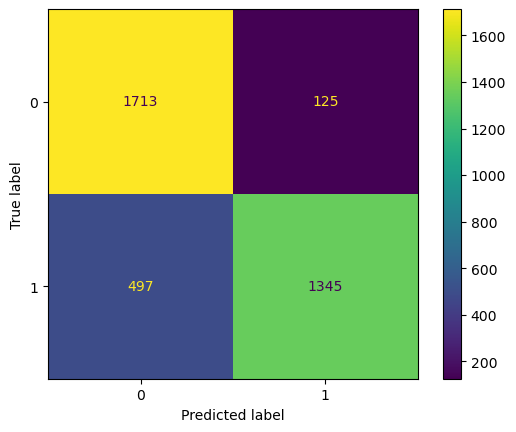

In [37]:
# Confusion Matrix
plot_confusion_matrix(rf_model, X_test, y_test)

From the above confusion matrix we can observe that the model made 1713 correct predictions for non-anomalies and 1345 correct predictions for anomalies. However, it also misclassified 125 non-anomalies as anomalies and 497 anomalies as non-anomalies.

Now we will perform Hyperparameter tuning for our Random Forest Classifier Model so that the tuned model can provide better performance than our current model.

<a id="rf2"></a>
# 4.2 Hyperparameter Tuning

**Hyperparameter Tuning**: It is the process of finding the best settings for a machine learning model to improve its performance. These settings, called "hyperparameters," control how the model learns from the data. By adjusting them, we can make the model more accurate and efficient. It’s like fine-tuning the engine of a car to get the best speed and fuel efficiency. In this project, we use hyperparameter tuning to ensure our model is optimized for detecting anomalies.

In [38]:
# Set parameters
param_grid = {
    'n_estimators':[20, 30, 40],
    'max_depth':[5, 10, 15]
}

# Build an object for the random forest classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Apply grid search cv and fit X_train and y_train to the model
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=2, n_jobs=-1, verbose=2, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Find the best hyperparameters and print them
best_hyperparameters = grid_search.best_params_
print('Best Hyperparameters: ', best_hyperparameters)

# Find the best estimators
best_rf_model = grid_search.best_estimator_

# Calculate predections for test data 
y_pred_tunned = best_rf_model.predict(X_test)

# Calculate predections for train data 
y_pred_tunned_train = best_rf_model.predict(X_train)

Fitting 2 folds for each of 9 candidates, totalling 18 fits
Best Hyperparameters:  {'max_depth': 15, 'n_estimators': 30}


In the above steps we are performing hyparameter tuning using GridSearchCV method so that the model can give us more correct predictions than before.

We can observe that after performing hyperparameter tuning on our random forest classifier we get best hyperparameters for our model which are {'max_depth': 15, 'n_estimators': 30}. Now let's check peformance metrics for the tunned model.

<a id="rf3"></a>
# 4.3 Model Performance after Hyperparameter Tuning

In [39]:
# Post hyperparameter accuracy score
accuracy = accuracy_score(y_test, y_pred_tunned)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 1.00


The model achieved perfect accuracy of 100%, indicating that all instances in the dataset were classified correctly as either anomalies or non-anomalies.

In [40]:
# Post hyperparameter roc_auc score
roc_auc = roc_auc_score(y_test, y_pred_tunned)
print(f'ROC AUC: {roc_auc: .2f}')

ROC AUC:  1.00


The roc auc score of 100% demonstrates the model’s perfect ability to distinguish between anomalous and non-anomalous instances, signifying flawless classification.

In [41]:
# Classification Report
print(classification_report(y_test, y_pred_tunned))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1838
           1       1.00      1.00      1.00      1842

    accuracy                           1.00      3680
   macro avg       1.00      1.00      1.00      3680
weighted avg       1.00      1.00      1.00      3680



Precision:

For class 0 (non-anomalous data), the precision is 100%, meaning that all of the instances predicted as class 0 were actually correct. For class 1 (anomalous data), the precision is 100%, meaning all of the instances predicted as class 1 were correct.

Recall:

For class 0, the recall is 100%, meaning all of the actual class 0 instances were correctly identified.
For class 1, the recall is 100%, meaning all of the actual class 1 instances were correctly identified.

F1-Score:

For class 0, the F1-score is 100%, balancing precision and recall. For class 1, the F1-score is 100%, indicating good performance in capturing anomalies.

Macro Average: The macro average precision, recall, and F1-score are 100, 100, and 100, respectively, which provide a flawless precision of the model's performance across both classes.

Weighted Average: The weighted averages are also close to the macro averages, confirming that the model handles the class imbalance extremely well after resampling.

In [42]:
# Post tunned train score
train_accuracy = accuracy_score(y_train, y_pred_tunned_train)
print(f"Train accuracy: {train_accuracy:.2f}")

Train accuracy: 1.00


Train accuracy of 100% means that the model perfectly identified all cases in the training data, meaning it learned the patterns in the data extremely well.

In [43]:
# Post tunned test score
test_accuracy = accuracy_score(y_test, y_pred_tunned)
print(f"Test accuracy: {test_accuracy:.2f}")

Test accuracy: 1.00


Test accuracy of 100% means that the model also made perfect predictions on the new, unseen test data. This indicates that the model performs flawlessly, even when faced with data it hasn’t encountered before.

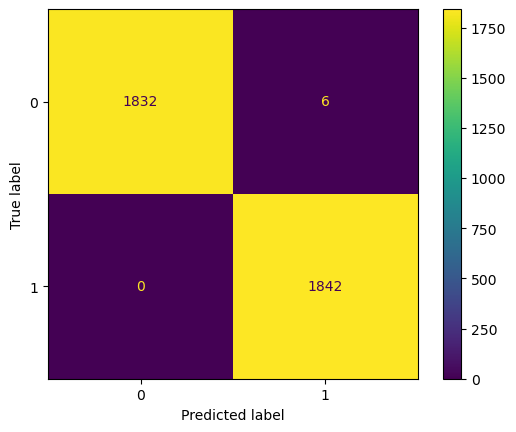

In [44]:
# Confusion Matrix
plot_confusion_matrix(best_rf_model, X_test, y_test)

The confusion matrix shows that the model correctly identified 1832 non-anomalies and 1842 anomalies, with only 6 non-anomalies misclassified as anomalies, while there were no misclassified anomalies. This indicates outstanding model performance with minimal misclassification.

<a id="rf4"></a>
# 4.4 Visualize the feature importances

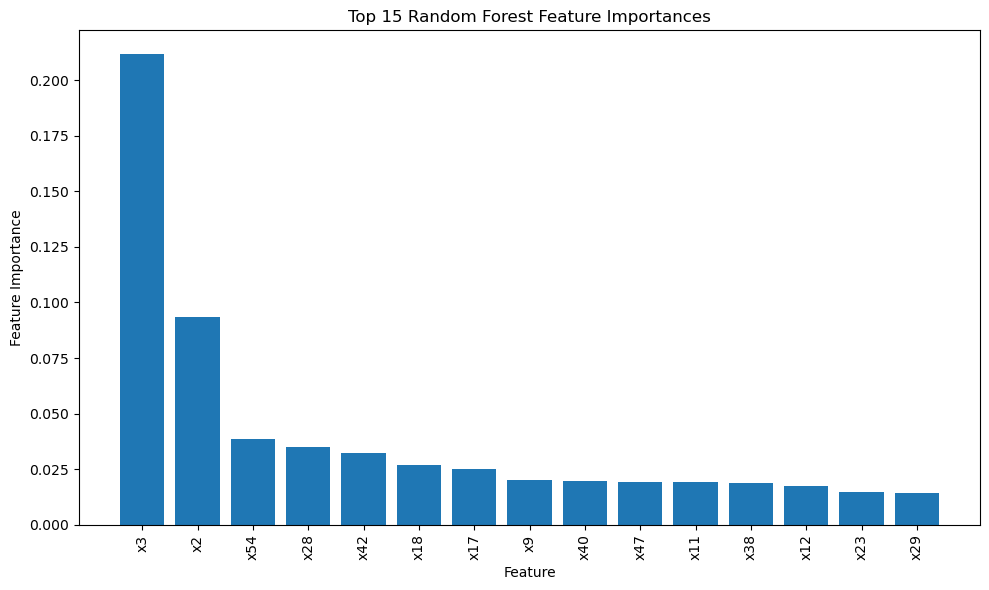

In [45]:
# set feature names
feature_names = X_train.columns

# Find feature importance using feature_importances_
feature_importances = best_rf_model.feature_importances_

# Sort Index
sorted_idx = feature_importances.argsort()[::-1]

# Set features to top 15 
top_n = 15
top_features = feature_importances[sorted_idx][:top_n]
top_feature_names = [feature_names[i] for i in sorted_idx][:top_n]

# Visualize a bar plot 
fig = plt.figure(figsize=(10, 6))
bar_plot = plt.bar(range(top_n), top_features)
bar1_data = [rect.get_height() for rect in plt.gca().patches]
plt.xticks(range(top_n), top_feature_names, rotation=90)
plt.xlabel('Feature')
plt.ylabel('Feature Importance')
plt.title('Top 15 Random Forest Feature Importances')
plt.tight_layout()
plt.show()

From the above barplot we can observer that x3, x2, x54, x28, x42, x18, x17, x9, x40, x47, x11, x38, x12, x23, x29 are our important features for the random forest classifier model. After observing the hyperparamter performance metrics we can say that random forest is a suitable model for anomaly dataset. 

<a id="knn1"></a>
# 5. KNearest Neighbors Model 

**K-Nearest Neighbors (KNN)**: This model is a simple yet effective machine learning algorithm used for classification tasks. It works by looking at the closest data points (or "neighbors") around a new piece of data and making a prediction based on what those neighbors represent. For anomaly detection in predictive maintenance, KNN helps identify unusual patterns that could signal equipment failure or the need for maintenance. By comparing new data to historical data, KNN can flag potential issues before they become critical, helping to prevent unexpected breakdowns.

In [46]:
# import KNeighborsClassifier function from scikit learn
from sklearn.neighbors import KNeighborsClassifier

# initial the model
knn_model = KNeighborsClassifier()

# fit the training data into the model
knn_model.fit(X_train, y_train)

# fit the testing data for prediction
y_pred = knn_model.predict(X_test)

# fit the training data for prediction
y_pred_train = knn_model.predict(X_train)

In the above steps we are creating a KNN model with the help of scikit learn library and after that we are fitting our train and test dataset into the model with the help of fit method, further we are passing the X_test and X_train data for prediction with the help of predict method which will help in model evaluation. 

<a id="knn2"></a>
# 5.1 Evaluate the model using the performance metrics

In [47]:
# print the testing accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test Accuracy: {test_accuracy:.2f}')

Test Accuracy: 0.97


Test accuracy of 97% means the model correctly classifies 97% of the instances in the test dataset, indicating a high level of overall performance.

In [48]:
# checking the roc auc score
roc_auc = roc_auc_score(y_test, y_pred)
print(f'ROC AUC: {roc_auc:.2f}')

ROC AUC: 0.97


ROC AUC Score of 97% means that the Area Under the Receiver Operating Characteristic Curve is 97%, suggesting excellent discrimination between the positive and negative classes.

In [49]:
# classification report
target_names = ['Negative(0)', 'Positive(1)']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

 Negative(0)       0.99      0.95      0.97      1838
 Positive(1)       0.96      0.99      0.97      1842

    accuracy                           0.97      3680
   macro avg       0.97      0.97      0.97      3680
weighted avg       0.97      0.97      0.97      3680



Precision: The model achieves a precision of 99% for Negative (0) and 96% for Positive (1), indicating a high proportion of true positive predictions relative to false positives.

Recall: Recall rates are 95% for Negative (0) and 99% for Positive (1), demonstrating the model's effectiveness in identifying true instances of both classes.

F1-Score: Both classes have an F1-score of 97%, reflecting a balanced performance between precision and recall.

Macro and Weighted Averages: The macro and weighted averages for precision, recall, and F1-score are all 97%, indicating consistent performance across both classes.

In [50]:
# print the train accuracy
train_accuracy = accuracy_score(y_train, y_pred_train)
print(f'Train Accuracy: {train_accuracy:.2f}')

Train Accuracy: 0.98


Train accuracy of 98% means that the model correctly identified anomalies in 98% of the cases using the data it was trained on. This means the model has learned to recognize patterns in the training data very well.

In [51]:
# print the test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test Accuracy: {test_accuracy:.2f}')

Test Accuracy: 0.97


Test accuracy of 97% means that the model correctly identified anomalies in 97% of the cases when tested on new, unseen data. This shows that the model maintains high accuracy even when applied to data it hasn't encountered before.

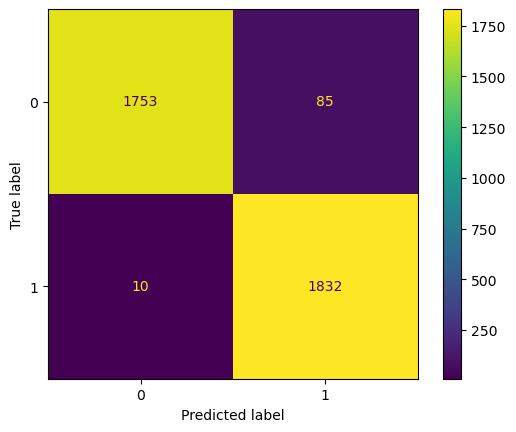

In [52]:
# plot confusion matrix
plot_confusion_matrix(knn_model, X_test, y_test)

We can observe from the Confusion matrix that the True Negatives: 1753, False Positives: 85, False Negatives: 10, True Positives: 1832. The matrix shows a strong ability to correctly identify both classes with minimal misclassification.

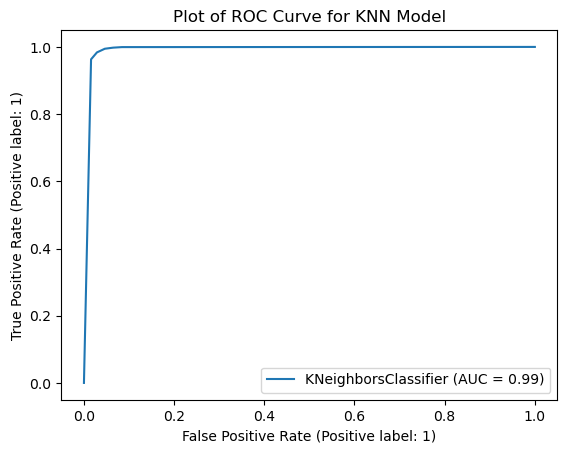

In [53]:
# plot the roc curve 
plot_roc_curve(knn_model, X_test, y_test)
plt.title('Plot of ROC Curve for KNN Model')
plt.show()

 The ROC curve's AUC of 99%  means that it reinforces the model's outstanding ability to distinguish between classes.

In [54]:
# check log loss
log_loss(y_test, knn_model.predict(X_test))

0.8916444900266534

A log loss of 89% reflects the model's predictive performance, with lower values indicating better classification confidence.

Now we will try to apply hyperparameter tunning to our KNN model to find out the best estimators of our model which will improve our overall models performance.

<a id="knn3"></a>
# 5.2 Hyperparameter Tuning

**Hyperparameter Tuning**: It is the process of finding the best settings for a machine learning model to improve its performance. These settings, called "hyperparameters," control how the model learns from the data. By adjusting them, we can make the model more accurate and efficient. It’s like fine-tuning the engine of a car to get the best speed and fuel efficiency. In this project, we use hyperparameter tuning to ensure our model is optimized for detecting anomalies.

In [55]:
# set the necessary parameters for param_grid 
param_grid = {
    'n_neighbors' : [3, 5, 7, 9],
    'weights' : ['uniform', 'distance'],
    'metric':['euclidean', 'mahattan', 'minkowski']
}

# apply gridsearch cv and fit the training data
grid_search_knn = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, scoring='accuracy')
grid_search_knn.fit(X_train, y_train)

# find best estimator
best_knn = grid_search_knn.best_estimator_

# find best hyperparameters
best_hyperparameters = grid_search_knn.best_params_
print("Best hyperparameters: ", best_hyperparameters)

# fit the test and train data for prediction
y_pred_knn_optimized = best_knn.predict(X_test)
y_pred_knn_optimized_train = best_knn.predict(X_train)

Best hyperparameters:  {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'uniform'}


In the above steps we are performing hyperparameter tuning using GridSearchCV method on our KNN model which will help the model to make better predictions than before. Also, we are finding our best estimator and best hyperparameters for better performance and lastly we are passing X_test and X_train for test and train accuracies.

After applying the hyperparameters on our KNN model we can see that our best hyperparameters are {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'uniform'}. Now let's examine the model peformance metrics.

<a id="knn4"></a>
# 5.3 Model Performance after Hyperparameter Tuning

In [56]:
# calculate accuracy for test data
test_accuracy = accuracy_score(y_test, y_pred_knn_optimized)
print(f'Accuracy for test dataset {test_accuracy:.2f}')

Accuracy for test dataset 0.98


Accuracy of 98% means that our model correctly classifies 98% of the instances, reflecting an improvement in overall performance after tuning.

In [57]:
# calculate the roc score
roc_auc = roc_auc_score(y_test, y_pred_knn_optimized)
print(f'ROC AUC Score: {roc_auc:.2f}')

ROC AUC Score: 0.98


ROC AUC score of 98% shows excellent capability to differentiate between the positive and negative classes, with near-perfect separation.

In [58]:
# classification report
target_names = ['Negative(0)', 'Positive(1)']

print(classification_report(y_test, y_pred_knn_optimized, target_names=target_names))

              precision    recall  f1-score   support

 Negative(0)       1.00      0.97      0.98      1838
 Positive(1)       0.97      1.00      0.98      1842

    accuracy                           0.98      3680
   macro avg       0.98      0.98      0.98      3680
weighted avg       0.98      0.98      0.98      3680



Precision: Precision is 100% for Negative (0) and 97% for Positive (1), highlighting a perfect identification of negative instances and strong accuracy for positive instances.

Recall: Recall is 97% for Negative (0) and 100% for Positive (1), indicating the model's high effectiveness in detecting both classes.

F1-Score: The F1-scores for both classes are 98%, demonstrating a balanced trade-off between precision and recall.

Macro and Weighted Averages: Macro and weighted averages of 98% across precision, recall, and F1-score suggest consistently high performance for both classes.

In [59]:
# print the train accuracy
train_accuracy = accuracy_score(y_train, y_pred_knn_optimized_train)
print(f'Accuracy for train dataset {train_accuracy:.2f}')

Accuracy for train dataset 0.99


Train accuracy of 99% means that the model correctly identified anomalies in 99% of the cases using the training data. This means the model has become even better at recognizing patterns after fine-tuning.

In [60]:
# print the test accuracy
test_accuracy = accuracy_score(y_test, y_pred_knn_optimized)
print(f'Accuracy for test dataset {test_accuracy:.2f}')

Accuracy for test dataset 0.98


Test accuracy of 98% means that the model accurately predicted anomalies in 98% of cases when tested on unseen data. This indicates the model maintains strong performance when applied to new data.

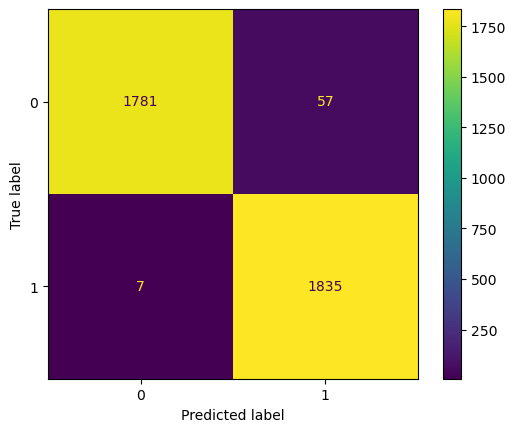

In [61]:
# plot confusion matrix
plot_confusion_matrix(best_knn, X_test, y_test)

We can observe from the above confusion matric that True Negatives: 1781, False Positives: 57, False Negatives: 7, True Positives: 1835. This shows the model minimizes misclassification, with very few false positives and false negatives.

In [62]:
# log loss
log_loss(y_test, best_knn.predict(X_test))

0.6006867571542958

A reduced log loss of 60% indicates improved confidence in the model's probability predictions after hyperparameter tuning.

<a id="knn5"></a>
# 5.4 Feature Importance for KNN model

In [63]:
# import permutation_importance from sci-kit learn
from sklearn.inspection import permutation_importance

# fit knn model
result = permutation_importance(best_knn, X_test, y_test, n_repeats=10, random_state=42)

# display importance
feature_importance_knn = result.importances_mean
sorted_idx = np.argsort(feature_importance_knn)[::-1]  # Sort in descending order

# Print top 10 most important features
print("Top 10 Most Important Features:")
for i in range(10):
    feature_idx = sorted_idx[i]
    print(f"Feature {X.columns[feature_idx]}: {feature_importance_knn[feature_idx]}")

Top 10 Most Important Features:
Feature x44: 0.4268478260869565
Feature x4: 0.24866847826086955
Feature x29: 0.21320652173913043
Feature x49: 0.21154891304347828
Feature x34: 0.14741847826086954
Feature x55: 0.1413586956521739
Feature x42: 0.11502717391304347
Feature x56: 0.09350543478260868
Feature x47: 0.08546195652173912
Feature x13: 0.05296195652173911


The above are the top 10 most important features of our tuned KNN model influencing the model's predictions. Each feature contributes to the model's ability to correctly identify anomalies, with higher values indicating greater importance. Feature x44 has the most significant impact on the model, followed by x4 and x29. Features lower on the list, such as x13, still contribute but with less influence compared to the top-ranked features.

<a id="nbm1"></a>
# 6. Naive Bayes Model

**Naive Bayes**: It is a straightforward and fast machine learning algorithm based on probability. It predicts outcomes by calculating the likelihood of different events based on past data. Despite its simplicity, Naive Bayes is powerful for detecting anomalies because it can quickly identify patterns that don’t fit normal behavior. In predictive maintenance, Naive Bayes can help flag unusual data that might indicate a potential equipment failure, allowing for timely maintenance and reducing the risk of unexpected breakdowns.

In [64]:
# import GaussianNB from scikit learn
from sklearn.naive_bayes import GaussianNB

# create model
nb_model = GaussianNB()

# fit X_train and y_train into model 
nb_model.fit(X_train, y_train)

# fit the testing data for prediction
y_pred = nb_model.predict(X_test)

#fit the training data for prediction
y_pred_train = nb_model.predict(X_train)

In the above cell we have imported the GaussianNB model from scikit-learn and created the model by fitting X_train and y_train data into our model using fit method. After that we are using X_test and X_train for prediction using predict method for model evaluation.  

<a id="nbm2"></a>
# 6.1 Evaluate the model using the performance metrics

In [65]:
# calculate the accuracy score
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy Score: {accuracy:.2f}')

Accuracy Score: 0.76


Accuracy Score of 76% means that the model correctly predicts 76% of the cases, meaning it successfully identifies most anomalies, but there is room for improvement.

In [66]:
# calculate the ROC AUC Score 
roc_auc = roc_auc_score(y_test, y_pred)
print(f'ROC AUC Score: {roc_auc:.2f}')

ROC AUC Score: 0.76


The ROC AUC score of 76% shows that the model is fairly good at distinguishing between normal and anomalous instances, with 0.5 being random guessing and 1 being perfect classification.

In [67]:
# Classification Report
target_names = ['Negative(0)', 'Positive(1)']

print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

 Negative(0)       0.75      0.79      0.77      1838
 Positive(1)       0.78      0.73      0.76      1842

    accuracy                           0.76      3680
   macro avg       0.76      0.76      0.76      3680
weighted avg       0.76      0.76      0.76      3680



Precision: For normal instances (Negative, 0), the precision is 0.75, meaning 75% of the predicted normal instances are truly normal. For anomalous instances (Positive, 1), the precision is 0.78, indicating that 78% of predicted anomalies are correct.

Recall: The model correctly identifies 79% of the normal instances and 73% of the anomalies, showing it is slightly better at identifying normal instances.

F1-Score: The F1-scores (0.77 for normal, 0.76 for anomalies) reflect a balance between precision and recall, showing how well the model performs overall for each class.

Macro and Weighted Averages: Both the macro and weighted averages for precision, recall, and F1-score are 0.76, suggesting consistent performance across both classes.

In [68]:
# Train accuracy
train_accuracy = accuracy_score(y_train, y_pred_train)
print(f'Train accuracy score: {train_accuracy:.2f}')

Train accuracy score: 0.76


Train accuracy of 76% means that the model correctly identified anomalies in 76% of the cases using the data it was trained on. This means the model has learned reasonably well from the training data.

In [69]:
# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test accuracy score: {test_accuracy:.2f}')

Test accuracy score: 0.76


Test accuracy of 76% means that the model also predicted anomalies with 76% accuracy on unseen test data, showing that its performance is consistent when applied to new data.

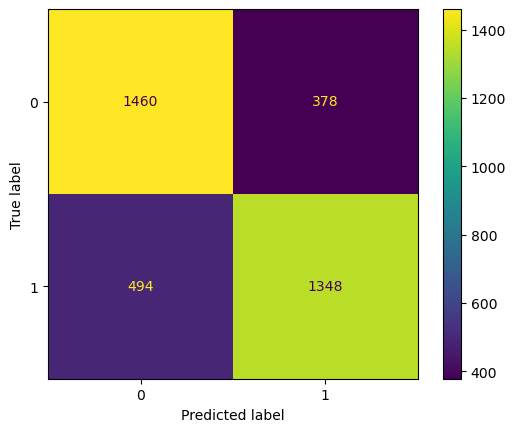

In [70]:
# Confusion Matrix
plot_confusion_matrix(nb_model, X_test, y_test)

From the above confusion matrix we can say that the model correctly identifies 1,460 normal instances but misclassifies 378 as anomalies (false positives). It correctly identifies 1,348 anomalies but misses 494, wrongly classifying them as normal (false negatives). This shows that the model makes more errors when predicting anomalies.

<a id="nbm3"></a>
# 6.2 Hyperparameter Tuning

**Hyperparameter Tuning**: It is the process of finding the best settings for a machine learning model to improve its performance. These settings, called "hyperparameters," control how the model learns from the data. By adjusting them, we can make the model more accurate and efficient. It’s like fine-tuning the engine of a car to get the best speed and fuel efficiency. In this project, we use hyperparameter tuning to ensure our model is optimized for detecting anomalies.

In [71]:
# Define the parameter grid for var_smoothing (regularization parameter)
param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]  # Typical values to try
}

# Perform grid search with cross-validation for GaussianNB
grid_search_nb = GridSearchCV(GaussianNB(), param_grid, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train, y_train)

# Get the best model and best parameters
best_nb = grid_search_nb.best_estimator_
print("Best var_smoothing value:", grid_search_nb.best_params_)

# fit the test data for prediction
y_pred_nb_optimized = best_nb.predict(X_test)

# fit the train data for prediction
y_pred_nb_optimized_train = best_nb.predict(X_train)

Best var_smoothing value: {'var_smoothing': 1e-07}


In the above cell we are performing hyperparameter tuning on GaussianNB model we have seen before that the GaussianNB model showed a decent performance. So, now we will apply the GridSearchCV to hence the performance of our model so that it can make better predictions on both train and test datast. We are also printing the best estimators for our model and then passing the X_test and X_train for prediction using predict method for model evaluation.  

After hyperparameter tuning, we can observe that the best var_smoothing value is '1e-07' which means that this parameter helps the model handle cases where data might have very low variance, preventing it from being too sensitive to small fluctuations or noise in the data. By smoothing out these small variations, the model becomes more stable and accurate. In this case, the value 1e-07 means the model is slightly smoothing the data to improve its ability to detect anomalies without being overly influenced by minor irregularities.

<a id="nbm4"></a>
# 6.3 Model Performance after Hyperparameter Tuning

In [72]:
# Accuracy and ROC AUC Scores
accuracy = accuracy_score(y_test, y_pred_nb_optimized)
roc_auc = roc_auc_score(y_test, y_pred_nb_optimized)

print(f"Accuracy Score: {accuracy:.2f}")
print(f"ROC AUC Score: {roc_auc: .2f}")

Accuracy Score: 0.79
ROC AUC Score:  0.79


Accuracy Score of 79% means that the model correctly classifies 79% of the data, meaning it is able to make accurate predictions most of the time, but there is still a small percentage of errors.

ROC AUC Score of 79% indicates how well the model can separate normal instances from anomalies. A score of 79% means the model has good, but not perfect, ability to distinguish between the two types.

In [73]:
# Classification report
target_names = ['Negative(0)', 'Positive(1)']

print(classification_report(y_test, y_pred_nb_optimized, target_names=target_names))

              precision    recall  f1-score   support

 Negative(0)       0.77      0.82      0.79      1838
 Positive(1)       0.81      0.76      0.78      1842

    accuracy                           0.79      3680
   macro avg       0.79      0.79      0.79      3680
weighted avg       0.79      0.79      0.79      3680



Precision: For normal cases (Negative, 0), precision is 0.77, meaning 77% of instances predicted as normal are truly normal. For anomalies (Positive, 1), precision is 0.81, meaning 81% of predicted anomalies are correct.

Recall: The model identifies 82% of the normal instances correctly (recall for Negative is 0.82) and 76% of anomalies correctly (recall for Positive is 0.76). This shows that the model is slightly better at catching normal instances than anomalies.

F1-Score: The F1-scores are 79% for normal and 78% for anomalies, reflecting a balanced performance in predicting both classes while considering both precision and recall.

Macro and Weighted Averages: The macro and weighted averages of 79% across precision, recall, and F1-score shows that the model performs consistently for both normal and anomalous instances.

In [74]:
# Train accuracy
train_accuracy = accuracy_score(y_train, y_pred_nb_optimized_train)
print(f'Train accuracy score: {train_accuracy:.2f}')

Train accuracy score: 0.78


Train accuracy score of 78% means that the model correctly identified anomalies in 78% of the cases with the training data, showing a slight improvement in how well it learned from the data.

In [75]:
# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred_nb_optimized)
print(f'Test accuracy score: {test_accuracy:.2f}')

Test accuracy score: 0.79


Test accuracy score of 79% means that the model's accuracy on unseen test data increased to 79%, indicating that it performs slightly better when applied to new data after tuning.

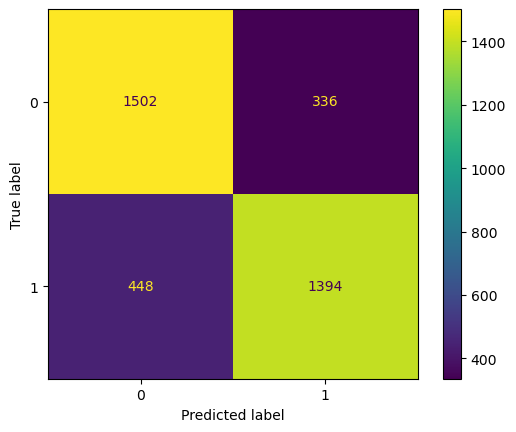

In [76]:
# Confusion Matrix
plot_confusion_matrix(best_nb, X_test, y_test)

The model correctly classifies 1,502 normal instances but mistakenly labels 336 as anomalies (false positives). It correctly identifies 1,394 anomalies but misses 448, wrongly classifying them as normal (false negatives). While the model has improved overall, it still makes more mistakes in identifying anomalies.

<a id="lr1"></a>
# 7. Logistic Regression Model

**Logistic Regression**: It is a supervised learning algorithm used for binary classification problems. It estimates the probability that a given input belongs to a particular class (in this case, "anomaly" or "non-anomaly") by fitting a linear relationship between the input features and the log-odds of the target class. The model uses the logistic function (or sigmoid) to map the outputs between 0 and 1, allowing the prediction of binary outcomes. In an anomaly detection problem, the goal is to classify data points as either "normal" (non-anomalies) or "anomalous." Logistic Regression is a great starting point for anomaly detection

In [77]:
# import logistic regression from scikit learn
from sklearn.linear_model import LogisticRegression

# initialize the logistic regression model
lr_model = LogisticRegression()

# fit the model into X_train and y_train
lr_model.fit(X_train, y_train)

# predict the test data
y_pred_lr = lr_model.predict(X_test)

# predict the train data
y_pred_lr_train = lr_model.predict(X_train)

In the above we have created a logistic regression model with the help of scikit learn library then we created the LR model and passed X_train and y_train data into the model with the help of fit method. After that we passed X_test and X_train for prediction using predict method for model evaluation.  

<a id="lr2"></a>
# 7.1 Evaluate the model using the performance metrics

In [78]:
# check accuracy score
accuracy = accuracy_score(y_test, y_pred_lr)
print(f'Accuracy Score: {accuracy:.2f}')

Accuracy Score: 0.83


Accuracy score of 83% means that the model correctly identified anomalies or normal cases 83% of the time. So, for every 100 instances, the model gets 83 correct and 17 incorrect.

In [79]:
# check roc_auc_score
roc_auc = roc_auc_score(y_test, y_pred_lr)
print(f'ROC AUC Score: {roc_auc:.2f}')

ROC AUC Score: 0.83


ROC AUC Score of 83% means that the model is good at distinguishing between anomalies and normal data points.

In [80]:
# classification report
target_names = ['Negative(0)', 'Positive(1)']

print(classification_report(y_test, y_pred_lr, target_names=target_names))

              precision    recall  f1-score   support

 Negative(0)       0.82      0.85      0.83      1838
 Positive(1)       0.84      0.81      0.83      1842

    accuracy                           0.83      3680
   macro avg       0.83      0.83      0.83      3680
weighted avg       0.83      0.83      0.83      3680



Precision: When the model flags something as an anomaly, it is correct 84% of the time.This helps us understand how many of the anomalies identified by the model are actually correct.

Recall: Out of all the true anomalies present in the data, the model correctly identifies 81% of them. This shows how well the model is at finding anomalies in the first place, even if it sometimes misses a few.

f1-score: The F1-score is a balance between precision and recall. For both anomalies and normal cases, this balance is 83%. It’s a measure of overall accuracy when both types of errors (false positives and false negatives) are important. It provides a good sense of the model’s general performance, combining both precision and recall.

In [81]:
# Train accuracy
train_accuracy = accuracy_score(y_train, y_pred_lr_train)
print(f"Train accuracy score: {train_accuracy:.2f}")

Train accuracy score: 0.84


Train accuracy of 84% means that the model successfully identified anomalies in 84% of the training data, indicating a solid understanding of the patterns in the data it learned from.

In [82]:
# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred_lr)
print(f'Test accuracy score: {test_accuracy:.2f}')

Test accuracy score: 0.83


Test accuracy of 83% means that the model also achieved an accuracy of 83% on unseen test data, demonstrating its ability to generalize well to new information.

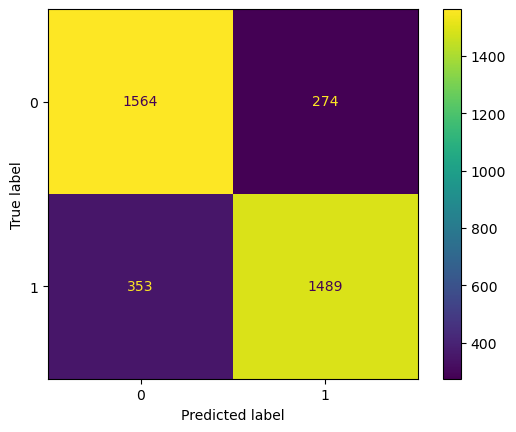

In [83]:
# confusion matrix
plot_confusion_matrix(lr_model, X_test, y_test)

From the above confusion matrix we can observe that 1564 normal points were correctly classified. 274 normal points were incorrectly flagged as anomalies (false positives). 1489 anomalies were correctly identified. 353 anomalies were missed and incorrectly classified as normal (false negatives). This breakdown helps us see the specific types of errors the model is making. For example, it misses 353 anomalies, which could be important in some cases.

In [84]:
# logloss
log_loss(y_test, lr_model.predict(X_test))

5.884791274267628

Log loss measures how far off the predicted probabilities are from the actual labels. A lower score is better. A value of 5.88 suggests the model is not perfectly calibrated but still provides useful probabilities. It helps understand how well the model's confidence in its predictions matches reality.

<a id="lr3"></a>
# 7.2 Hyperparameter Tuning

**Hyperparameter Tuning**: It is the process of finding the best settings for a machine learning model to improve its performance. These settings, called "hyperparameters," control how the model learns from the data. By adjusting them, we can make the model more accurate and efficient. It’s like fine-tuning the engine of a car to get the best speed and fuel efficiency. In this project, we use hyperparameter tuning to ensure our model is optimized for detecting anomalies.

In [85]:
# define the hyperparameter grid
param_grid = {
    'C':[0.1, 1, 10, 100],
    'penalty':['l1', 'l2'],
    'solver':['liblinear', 'saga']
}

# use gridsearchcv for tuning
grid_search = GridSearchCV(lr_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# print the best hyperparameters
print("Best parameters found: ", grid_search.best_params_)

# best estimator
best_log_reg = grid_search.best_estimator_

# predict the test data
y_pred_tunned_lr = best_log_reg.predict(X_test)

# predict the train data
y_pred_tunned_lr_train = best_log_reg.predict(X_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best parameters found:  {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}


In the above cell we are applying hyperparameter tuning to Logistic Regression model so that the models performance can be increased using GridSearchCV. We are passing X_train and y_train data into our model to fit using fit method and then we are finding the best estimator for our tuned model. After that we are passing X_test and X_train for test and train prediction using predict method for model evaluation. 

After performing the Grid Search CV for hyperparameter tuning we got best parameters as 'C': 100, 'penalty': 'l2', 'solver': 'liblinear'. Now let's check tuned model's performance.

<a id="lr4"></a>
# 7.3 Model Performance after Hyperparameter Tuning

In [86]:
# accuracy score
accuracy = accuracy_score(y_pred_tunned_lr, y_test)
print(f"Accuracy Score: {accuracy:.2f}")

Accuracy Score: 0.89


We can observe that after tuning the model our accuracy score has been increased to 89% which means that the model correctly classifies anomalies and normal cases 89% of the time, an improvement over the previous 83%.

In [87]:
# roc auc score
roc_auc = roc_auc_score(y_pred_tunned_lr, y_test)
print(f'ROC AUC Score: {roc_auc:.2f}')

ROC AUC Score: 0.89


Also our ROC AUC Score has been increased by 89% which means that the model's ability to distinguish between anomalies and normal cases has increased, with the ROC AUC score rising to 0.89, indicating better overall discrimination.

In [88]:
# classification report
print(classification_report(y_pred_tunned_lr, y_test))

              precision    recall  f1-score   support

           0       0.91      0.87      0.89      1915
           1       0.87      0.90      0.88      1765

    accuracy                           0.89      3680
   macro avg       0.89      0.89      0.89      3680
weighted avg       0.89      0.89      0.89      3680



For normal cases (0), the model has a precision of 91% and recall of 87%, meaning it correctly identifies most normal cases while minimizing false positives.

For anomalies (1), it achieves a precision of 87% and recall of 90%, meaning it captures a higher number of actual anomalies compared to before.

f1 score for both class is 89% which means the harmonic mean of precision and recall, providing a single score that balances both metrics.

Macro Average: This average treats all classes equally, showing an overall performance of 89% for precision, recall, and F1-score across both classes.

Weighted Average: This average takes into account the number of instances in each class, also showing 89% for all metrics.

In [89]:
# Train accuracy
train_accuracy = accuracy_score(y_train, y_pred_tunned_lr_train)
print(f"Train accuracy score: {train_accuracy:.2f}")

Train accuracy score: 0.89


Train accuracy score of 89% means that the model correctly identified anomalies in 89% of the training data, indicating a strong understanding of the patterns in the data it learned from.

In [90]:
# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred_tunned_lr)
print(f"Test accuracy score: {test_accuracy:.2f}")

Test accuracy score: 0.89


Test accuracy score of 89% means that the model maintained the same accuracy of 89% on unseen test data, demonstrating its reliability and ability to generalize well to new information.

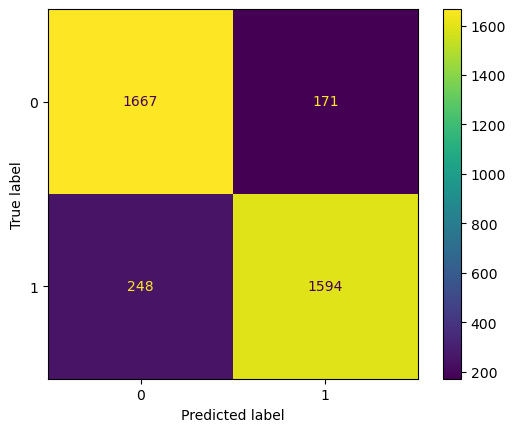

In [91]:
# confusion matrix
plot_confusion_matrix(best_log_reg, X_test, y_test)

From the above confusion matrix we can see that our model reduced both false positives (171) and false negatives (248), showing fewer errors compared to the previous model.

In [92]:
# log loss
log_loss(y_test, best_log_reg.predict(X_test))

3.932577184953299

The log loss decreased to 3.93, indicating the model's probabilistic predictions are more accurate and better calibrated.

<a id="lr5"></a>
# 7.4 Feature Importance for LR model

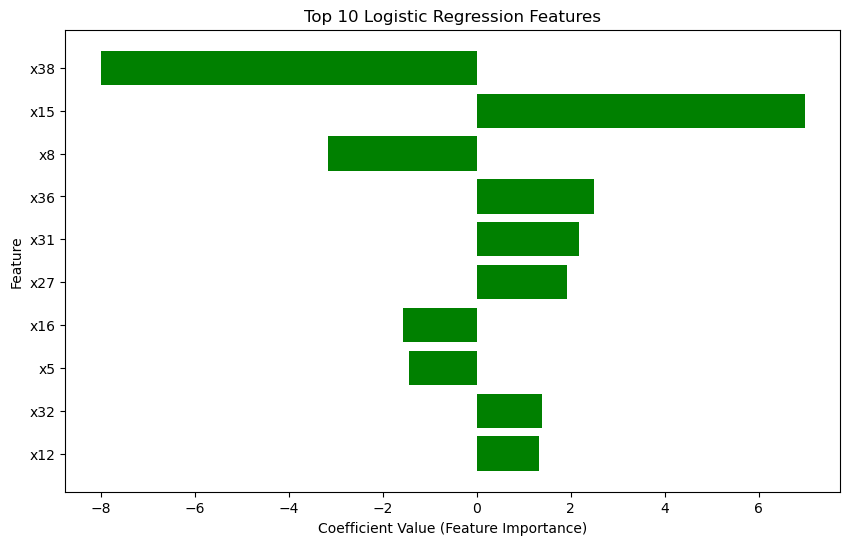

In [93]:
# get feature names
feature_names = X_train.columns

# get the model coefficients
coefficients = best_log_reg.coef_[0]

# create a dataframe to display feature importance
feature_importance = pd.DataFrame({
    'Feature':feature_names,
    'Importance':coefficients
})

# Sort the features by absolute value of the coefficients to find the top 10 most important features
feature_importance['abs_importance'] = np.abs(feature_importance['Importance'])
top_10_features = feature_importance.sort_values(by='abs_importance', ascending=False).head(10)

# Display top 10 feature importance
#print(top_10_features[['Feature', 'Importance']])

# Plot the top 10 feature importance
plt.figure(figsize=(10, 6))
plt.barh(top_10_features['Feature'], top_10_features['Importance'], color='green')
plt.xlabel('Coefficient Value (Feature Importance)')
plt.ylabel('Feature')
plt.title('Top 10 Logistic Regression Features')
plt.gca().invert_yaxis()  # To display the largest feature at the top
plt.show()

Positive Coefficients: Features with positive coefficients increase the likelihood of the model predicting the positive class (anomaly). This means that as the value of this feature increases, the model is more likely to predict that the instance is an anomaly.

Negative Coefficients: Features with negative coefficients decrease the likelihood of predicting an anomaly. As the value of this feature increases, the model is more likely to predict a normal instance (non-anomaly).

<a id="cl1"></a>
# 8. Conclusion

### Conclusion of Anomaly Detection Project

In this project, we aimed to build a model capable of accurately identifying anomalies (unusual data points) and non-anomalies (normal data points). Four machine learning models were used to achieve this goal, and their performance was evaluated before and after optimizing them through a process called hyperparameter tuning.

### Models and Their Importance:

### Random Forest Classifier:

- Before tuning: Accuracy 83%
- After tuning: Accuracy 100%

**Classification Report**:

- Precision:

Precision is 100%, meaning that all of the instances predicted as Negative (0) were actually correct. The precision is 100%, meaning all of the instances predicted as Positive (1) were correct.

- Recall:

Recall is 100%, meaning all of the actual Negative (0) instances were correctly identified. The recall is 100%, meaning all of the actual Positive (1) instances were correctly identified.

- F1-Score:

F1-score is 100%, balancing precision and recall. The F1-score is 100%, indicating good performance in capturing anomalies.

**Confusion Matrix**:
 
- 1832 non-anomalies 
- 1842 anomalies 
- 6 non-anomalies misclassified as anomalies 
- no misclassified anomalies.

**Accuracy**:

- Train Accuracy - 100% 
- Test Accuracy - 100%

**Explanation**: The Random Forest Classifier showed remarkable improvement after tuning, achieving perfect accuracy. This model is particularly powerful because it uses multiple decision trees to make predictions. Each tree looks at different parts of the data and combines the results for more accurate classification. In our case, it became exceptionally good at distinguishing between anomalies and normal data after tuning.

### K-Nearest Neighbors (KNN):

- Before tuning: Accuracy 97%
- After tuning: Accuracy 98%

**Classification Report**:

- Precision: 

Precision is 100% for Negative (0) and 97% for Positive (1), highlighting a perfect identification of negative instances and strong accuracy for positive instances.

- Recall: 

Recall is 97% for Negative (0) and 100% for Positive (1), indicating the model's high effectiveness in detecting both classes.

- F1-Score: 

F1-Score for both classes are 98%, demonstrating a balanced trade-off between precision and recall.

**Confusion Matrix**:

- 1781 non-anomalies 
- 1835 anomalies
- 57 non-anomalies misclassified as anomalies
- 7 anomalies misclassified as non-anomalies

**Accuracy**:

- **Train Accuracy** - 99% 
- **Test Accuracy** - 98%

**Explanation**: KNN performed very well even before tuning and improved slightly after optimization. KNN works by looking at similar data points (its "neighbors") to classify new data. This model was effective at identifying patterns in the data and finding anomalies based on those patterns.

### Logistic Regression:

- Before tuning: Accuracy 83%
- After tuning: Accuracy 89%

**Classification Report**:

- Precision:

Precision is 91% for Negative(0) and 87% for Positive (1) highlighting a perfect identification of negative instances and strong accuracy for positive instances.

- Recall:

Recall is 87% for Negative(0) and 90% for Positive (1) indicating the model's high effectiveness in detecting both classes.

- F1-Score:

F1-score for both class is 89%, demonstrating a balanced trade-off between precision and recall.

**Confusion Matrix**:

- 1667 non-anomalies
- 1594 anomalies
- 171 non-anomalies misclassified as anomalies
- 248 anomalies misclassified as non-anomalies

**Accuracy**:

- **Train Accuracy** - 89%
- **Test Accuracy** - 89%

Explanation: Logistic Regression improved significantly after tuning, reaching 89% accuracy. This model uses a mathematical function to predict whether a data point is an anomaly or not. Logistic regression is simple but interpretable, making it valuable for understanding which factors contribute to anomalies.

### Naive Bayes:

- Before tuning: Accuracy 76%
- After tuning: Accuracy 79%

**Classification Report**:

- Precision:

Precision is 77% for Negative (0) and 81% for Positive (1) highlighting a perfect identification of negative instances and strong accuracy for positive instances.

- Recall:

Recall is 82% for Negative (0) and 76% for Positive (1) indicating the model's high effectiveness in detecting both classes.

- F1-Score:

F1-scores are 79% for normal and 78% for anomalies, reflecting a balanced performance in predicting both classes while considering both precision and recall.

**Confusion Matrix**:

- 1502 non-anomalies
- 1394 anomalies
- 336 non-anomalies misclassified as anomalies
- 448 anomalies misclassified as non-anomalies

**Accuracy**:

- **Train Accuracy** - 78%
- **Test Accuracy** - 79%

Explanation: The Naive Bayes model showed the least improvement and had the lowest accuracy. This model is based on the assumption that features are independent, which might not fully apply to our dataset, limiting its performance.

### Best Performing Models (in decreasing order):

Random Forest Classifier (100%): Best performance, especially after tuning, because it combines the predictions of multiple decision trees for exceptional accuracy.

K-Nearest Neighbors (98%): Close second, due to its ability to identify similar data points and patterns effectively.

Logistic Regression (89%): A strong model for anomaly detection, especially after tuning, offering simplicity and interpretability.

Naive Bayes (79%): Although useful, this model didn’t perform as well due to its assumptions about the data.

### Conclusion:

The Random Forest Classifier was the best model for detecting anomalies, achieving perfect accuracy after tuning. Its ability to aggregate decisions from multiple trees made it highly effective. KNN and Logistic Regression also performed well and are strong alternatives. Naive Bayes was less effective but still provided valuable insights. Overall, the models demonstrated varying levels of effectiveness in identifying anomalies, with Random Forest standing out as the most reliable.